# **Assignment 1: Analyzing Traffic Accident Data from South Australia**

Group 3 members:
1. Maria Maló
2. Nisrina Mozza Khairunnisa
3. Patrycja Jaworek
4. Sandra Rojek

# 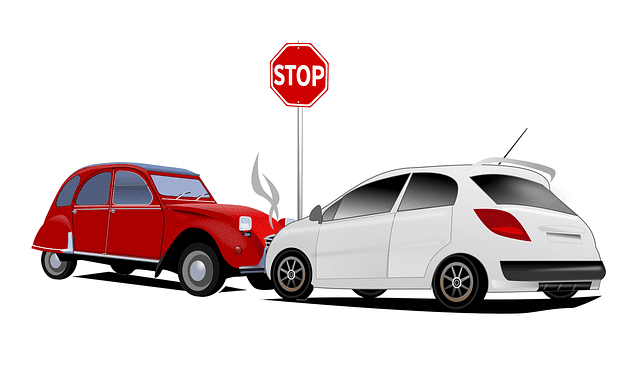

In this work, it is aimed to perform a deep exploration of traffic accident data from South Australia, identifying patterns and highlighting important findings that could help government decision-making.


**Connect with google drive to get data**



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Data loading**

It was loaded as much information as possible from the different csv files provided, merging everything together into a single dataframe.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Google Drive Path
base_path = '/content/drive/My Drive/Colab Notebooks/data_science_project_1/'

# Loading each file
accidents = pd.read_csv(base_path + 'victorian_road_crash_data.csv')
atmos = pd.read_csv(base_path + 'atmospheric_cond.csv')
person = pd.read_csv(base_path + 'person.csv')
road_surface = pd.read_csv(base_path + 'road_surface_cond.csv')

# Merging all data
df = accidents.merge(atmos, on='ACCIDENT_NO', how='left') \
              .merge(person, on='ACCIDENT_NO', how='left') \
              .merge(road_surface, on='ACCIDENT_NO', how='left')

## **Summary Statistics**

This section aims to describe the overall structure of the data.

In [ ]:
print("Data Summary:\n")
print("Total number of acidents recorded is", len(df),"\n") # Total number of acidents
print("Features of each acident and their counts:\n")

df.info() # Different features of each accident
df.head() # Data summary

df['ACCIDENT_DATE'] = pd.to_datetime(df['ACCIDENT_DATE'], errors='coerce')

# Accident date interval

start_date = df['ACCIDENT_DATE'].min()
end_date = df['ACCIDENT_DATE'].max()
print("")
print(f"Dataset covers from {start_date:%d %B %Y} to {end_date:%d %B %Y}.")

Data Summary:

Total number of acidents recorded is 441191 

Features of each acident and their counts:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441191 entries, 0 to 441190
Data columns (total 71 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ACCIDENT_NO             441191 non-null  object 
 1   ACCIDENT_DATE           441191 non-null  object 
 2   ACCIDENT_TIME           441191 non-null  object 
 3   ACCIDENT_TYPE           441191 non-null  object 
 4   DAY_OF_WEEK             441191 non-null  object 
 5   DCA_CODE                441191 non-null  int64  
 6   DCA_CODE_DESCRIPTION    441191 non-null  object 
 7   LIGHT_CONDITION         441191 non-null  object 
 8   POLICE_ATTEND           441191 non-null  object 
 9   ROAD_GEOMETRY           441191 non-null  object 
 10  SEVERITY                441191 non-null  object 
 11  SPEED_ZONE              441191 non-null  object 
 12  RUN_OFFROAD            

## **Regional Patterns**

In section explores urbanization and areas patterns.

**Data preprocessing**

In [ ]:
cols_check = ['LGA_NAME','SEVERITY','DEG_URBAN_NAME']

available_cols = [c for c in cols_check if c in accidents.columns]

missing_summary = pd.DataFrame({
    'Missing Values': accidents[available_cols].isna().sum(),
    'Missing Percent': (accidents[available_cols].isna().mean() * 100).round(2)
}).sort_values(by='Missing Percent', ascending=False)

display(missing_summary)


,Missing Values,Missing Percent
DEG_URBAN_NAME,988,0.53
LGA_NAME,90,0.05
SEVERITY,0,0.00


In this section, a neglegible percentage of features were missing so they were skipped, as it will not affected the analysis.

**Top 10 areas by number of accidents**

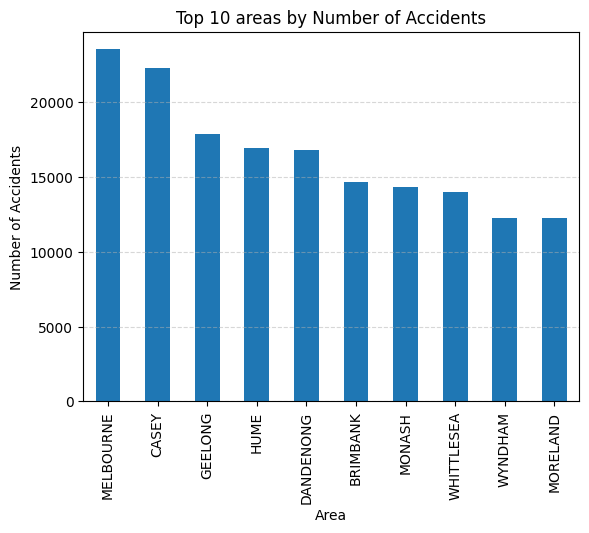

In [ ]:
accidents_by_lga = df['LGA_NAME'].value_counts().head(10)
accidents_by_lga.head(10).plot(kind='bar')
plt.title('Top 10 areas by Number of Accidents')
plt.xlabel('Area')
plt.ylabel('Number of Accidents')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

Most accidents happen in Melbourne, the most populated urban area in Australia. Casey, which is also a very populated city, comes in second. The other areas are industrial places or connected to free-ways.

**Severity in top 10 areas**

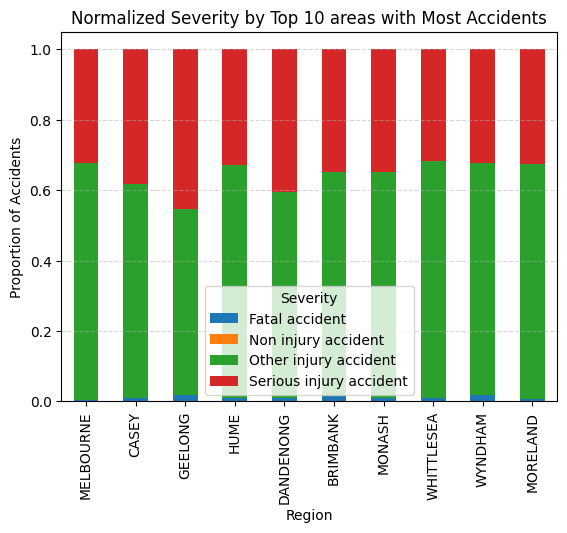

In [ ]:
df_plot = df.dropna(subset=['LGA_NAME', 'SEVERITY'])
accident_counts = df['LGA_NAME'].value_counts()

# Get 10 regions with the most accidents

top10_regions = accident_counts.head(10).index
region_severity = (df.groupby(['LGA_NAME', 'SEVERITY']).size().unstack(fill_value=0).apply(lambda x: x / x.sum(), axis=1))
region_severity_top10 = region_severity.loc[top10_regions]

# Plotting

region_severity_top10.plot(kind='bar',stacked='True')
plt.title('Normalized Severity by Top 10 areas with Most Accidents')
plt.xlabel('Region')
plt.ylabel('Proportion of Accidents')
plt.legend(title='Severity')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

*   All areas share a common severity plot: most accidents are of other injury, a smaller percentage is serious injury accidents and a very small percentage is fatal and non injury accidents.
*   Geelong is the area with a higher % of serious injury accidents. This may be because Geelong connects to Melbourne through highways, where people drive faster, which may cause more severe accidents.

**Number of accidents per degree of urbanization**

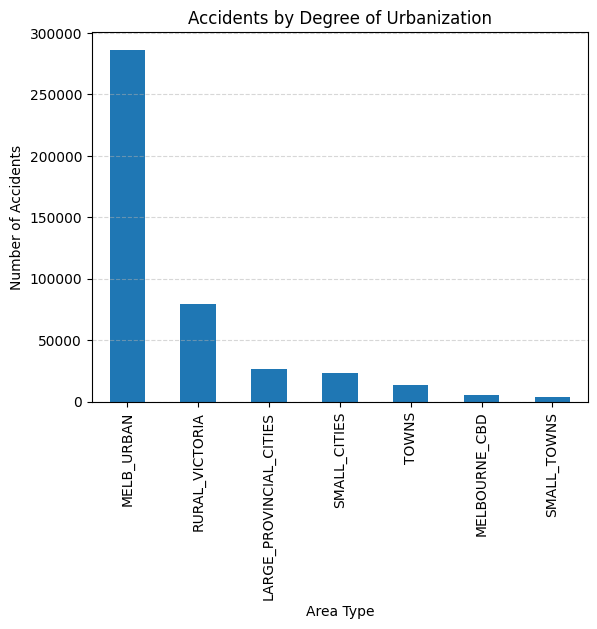

In [ ]:
df['DEG_URBAN_NAME'].value_counts().plot(kind='bar')
plt.title('Accidents by Degree of Urbanization')
plt.xlabel('Area Type')
plt.ylabel('Number of Accidents')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

The plot speaks for itself: a very large proportion of accidents happen in Melbourn urban area.

**Severity by degree of urbanization**

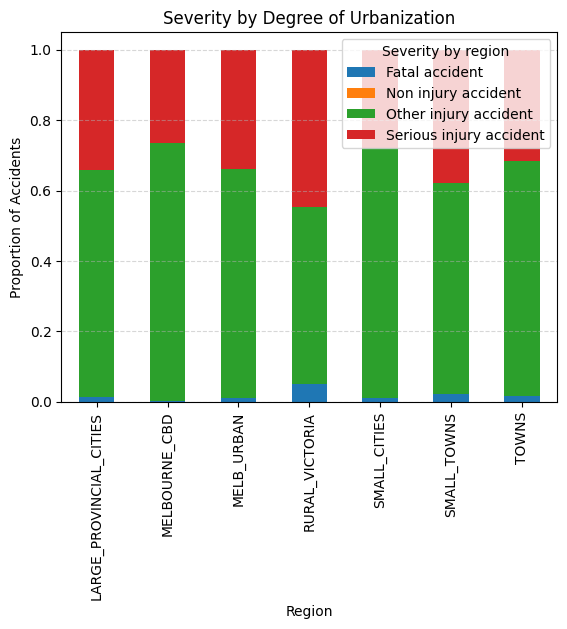

In [ ]:
normalized = df.groupby('DEG_URBAN_NAME')['SEVERITY'].value_counts(normalize=True).unstack()
normalized.plot(kind='bar', stacked='True')
plt.title('Severity by Degree of Urbanization')
plt.xlabel('Region')
plt.ylabel('Proportion of Accidents')
plt.legend(title='Severity by region')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

*   We have a similar tendency as the previous severity chart.

*   Rural victoria seems to have a more % of serious and fatal accidents: single-lane roads and conditions.


 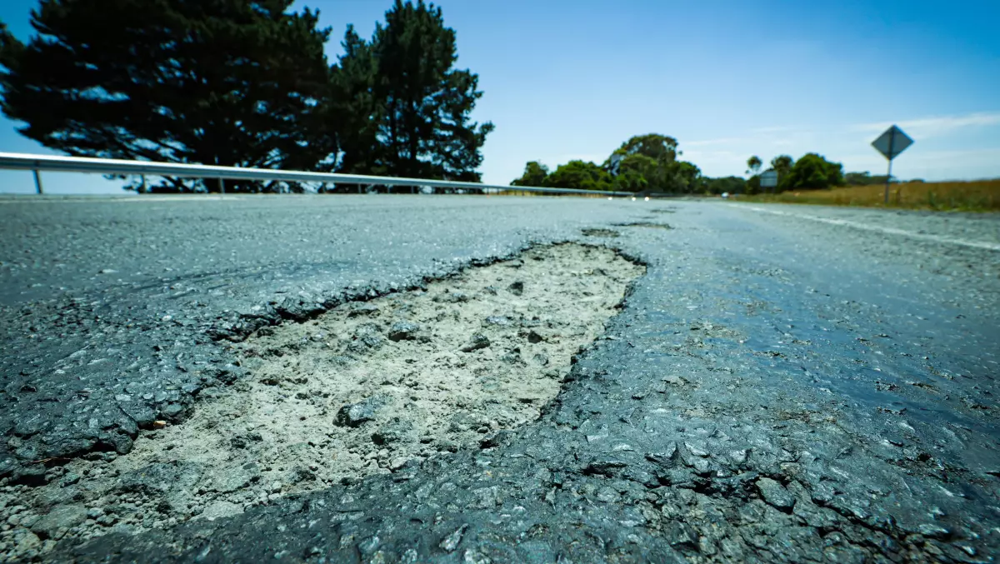

**Recomendations:**


*   Improve road conditions.



## **Light & Road Conditions**

In this section it is explored how different light and road conditions could impact accidents and their severity.

**Data preprocessing**

In this section, some missing values were found so data preprocessing was done.

In [ ]:
missing_summary = df[['LIGHT_CONDITION', 'SURFACE_COND_DESC']].isna().agg(['sum', 'mean']).T
missing_summary.columns = ['Missing Values', 'Missing Percent']
missing_summary['Missing Percent'] = (missing_summary['Missing Percent'] * 100).round(2)

display(missing_summary)


,Missing Values,Missing Percent
LIGHT_CONDITION,0.0,0.0
SURFACE_COND_DESC,0.0,0.0


In [ ]:
cols_check = [
    'ACCIDENT_NO', 'ACCIDENT_DATE', 'ACCIDENT_TIME', 'DAY_WEEK_DESC',
    'LIGHT_CONDITION', 'SURFACE_COND_DESC', 'ATMOSPH_COND_DESC',
    'ROAD_TYPE', 'SEVERITY_DESC', 'NO_PERSONS', 'NO_VEHICLES',
    'LONGITUDE', 'LATITUDE'
]

available_cols = [c for c in cols_check if c in accidents.columns]

missing_summary = pd.DataFrame({
    'Missing Values': accidents[available_cols].isna().sum(),
    'Missing Percent': (accidents[available_cols].isna().mean() * 100).round(2)
}).sort_values(by='Missing Percent', ascending=False)

display(missing_summary)


,Missing Values,Missing Percent
ROAD_TYPE,2469,1.33
LONGITUDE,85,0.05
LATITUDE,85,0.05
ACCIDENT_TIME,0,0.00
ACCIDENT_DATE,0,0.00
ACCIDENT_NO,0,0.00
LIGHT_CONDITION,0,0.00


The accident dataset is mostly complete, with only small missing parts in road type and location data. These small gaps will not significantly affect the analysis, so we will just erase the lines with missing values.

**Data cleaning**

In [ ]:
df['LIGHT_CONDITION'] = df['LIGHT_CONDITION'].str.strip().str.title()
df['SURFACE_COND_DESC'] = df['SURFACE_COND_DESC'].str.strip().str.title()

light_map = {
    'Unk.': 'Unknown',
    'Dusk/Dawn': 'Low Light',
    'Dark Street Lights On': 'Dark (Lit)',
    'Dark Street Lights Off': 'Dark (Unlit)',
    'Dark No Street Lights': 'Dark (Unlit)',
    'Dark Street Lights Unknown': 'Dark (Unknown)',
    'Day': 'Daylight'
}
df['LIGHT_CONDITION'] = df['LIGHT_CONDITION'].replace(light_map)

surface_map = {
    'Unk.': 'Unknown',
    'Wet - Oil': 'Wet',
    'Wet Or Muddy': 'Wet',
    'Ice Or Frost': 'Icy',
    'Dry Road': 'Dry',
    'Dry - Loose Material': 'Dry'
}
df['SURFACE_COND_DESC'] = df['SURFACE_COND_DESC'].replace(surface_map)

print("Final LIGHT_CONDITION values:", df['LIGHT_CONDITION'].unique())
print("\nFinal SURFACE_COND_DESC values:", df['SURFACE_COND_DESC'].unique())
print("\nMissing values:")
print(df[['LIGHT_CONDITION', 'SURFACE_COND_DESC']].isna().sum())


Final LIGHT_CONDITION values: ['Dark (Unlit)' 'Dark (Lit)' 'Daylight' 'Low Light' 'Unknown'
 'Dark (Unknown)']

Final SURFACE_COND_DESC values: ['Dry' 'Wet' 'Unknown' 'Muddy' 'Icy' 'Snowy']

Missing values:
LIGHT_CONDITION      0
SURFACE_COND_DESC    0
dtype: int64


In [ ]:
print(df['LIGHT_CONDITION'].value_counts())
print("\n")
print(df['SURFACE_COND_DESC'].value_counts())


LIGHT_CONDITION
Daylight          301637
Dark (Lit)         68650
Low Light          36581
Dark (Unlit)       20157
Unknown             9974
Dark (Unknown)      4192
Name: count, dtype: int64


SURFACE_COND_DESC
Dry        349515
Wet         64339
Unknown     23975
Muddy        1672
Icy          1366
Snowy         324
Name: count, dtype: int64


**Distribution of Light Conditions**

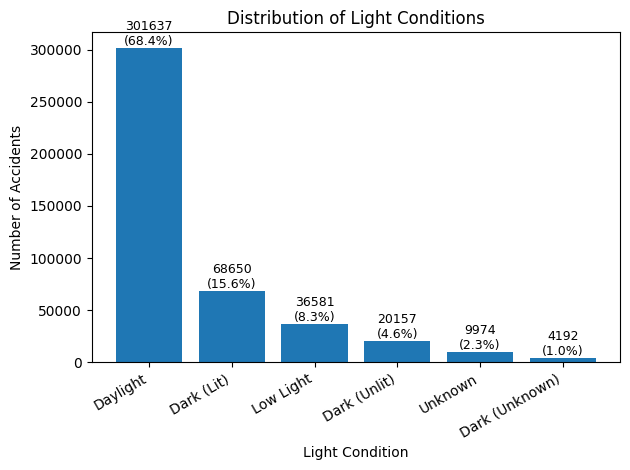

In [ ]:
light_counts = df['LIGHT_CONDITION'].value_counts()
total = light_counts.sum()

plt.bar(light_counts.index, light_counts.values)
plt.title('Distribution of Light Conditions')
plt.xlabel('Light Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(light_counts.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


**Distribution of Road Surface Conditions**

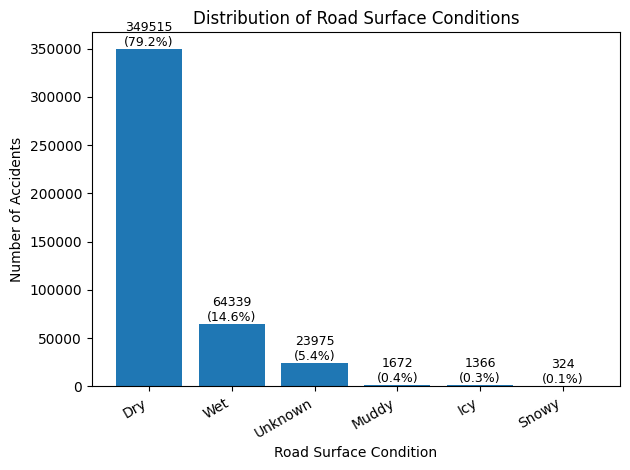

In [ ]:
surface_counts = df['SURFACE_COND_DESC'].value_counts()
total = surface_counts.sum()

plt.bar(surface_counts.index, surface_counts.values)
plt.title('Distribution of Road Surface Conditions')
plt.xlabel('Road Surface Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(surface_counts.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


**Relationship between Light and Road Surface Conditions**

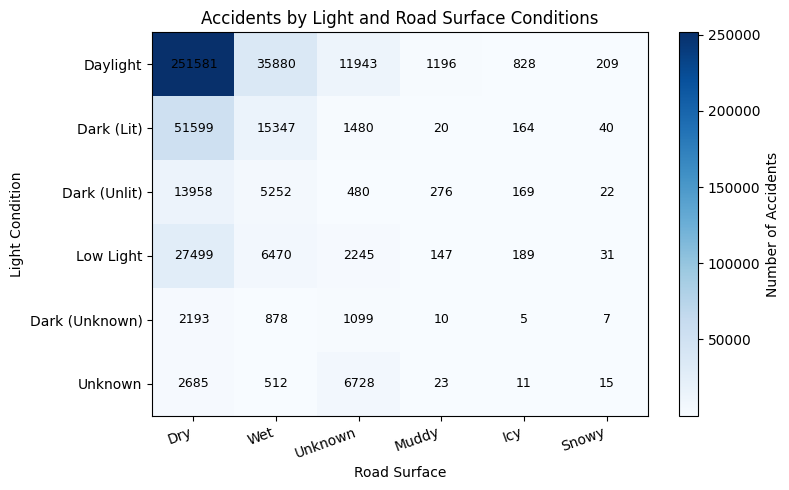

In [ ]:
ct = pd.crosstab(df['LIGHT_CONDITION'], df['SURFACE_COND_DESC'])

light_order = ['Daylight', 'Dark (Lit)', 'Dark (Unlit)', 'Low Light', 'Dark (Unknown)', 'Unknown']
surf_order = ['Dry', 'Wet', 'Unknown', 'Muddy', 'Icy', 'Snowy']

ct = ct.reindex(index=[x for x in light_order if x in ct.index],
                columns=[x for x in surf_order if x in ct.columns])

plt.figure(figsize=(8,5))
plt.imshow(ct, cmap='Blues', aspect='auto')

plt.xticks(range(len(ct.columns)), ct.columns, rotation=20, ha='right')
plt.yticks(range(len(ct.index)), ct.index)

for i, row in enumerate(ct.values):
    for j, val in enumerate(row):
        plt.text(j, i, val, ha='center', va='center', fontsize=9)

plt.title('Accidents by Light and Road Surface Conditions')
plt.xlabel('Road Surface')
plt.ylabel('Light Condition')
plt.colorbar(label='Number of Accidents')
plt.tight_layout()
plt.show()


**Serious and fatal accidents**

**Data preprocessing**

In [ ]:
print(f"Missing: {df['SEVERITY'].isna().sum()} ({df['SEVERITY'].isna().mean()*100:.2f}%)")


Missing: 0 (0.00%)


In [ ]:
severity_counts = df['SEVERITY'].value_counts().reset_index()
severity_counts.columns = ['SEVERITY', 'Count']
severity_counts.loc[len(severity_counts)] = ['Total Serious & Fatal',
    severity_counts[severity_counts['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]['Count'].sum()]
severity_counts.loc[len(severity_counts)] = ['Total', severity_counts['Count'].sum()]
display(severity_counts)


,SEVERITY,Count
0,Other injury accident,276657
1,Serious injury accident,156694
2,Fatal accident,7833
3,Non injury accident,7
4,Total Serious & Fatal,164527
5,Total,605718


**Distribution of Light Conditions (Serious & Fatal only)**

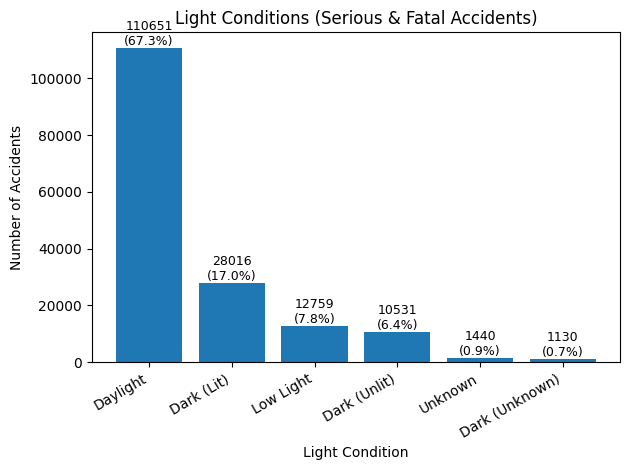

In [ ]:
sf = df[df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]
counts = sf['LIGHT_CONDITION'].value_counts()
total = counts.sum()

plt.bar(counts.index, counts.values)
plt.title('Light Conditions (Serious & Fatal Accidents)')
plt.xlabel('Light Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(counts.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


**Distribution of Road Surface Conditions (Serious & Fatal)**

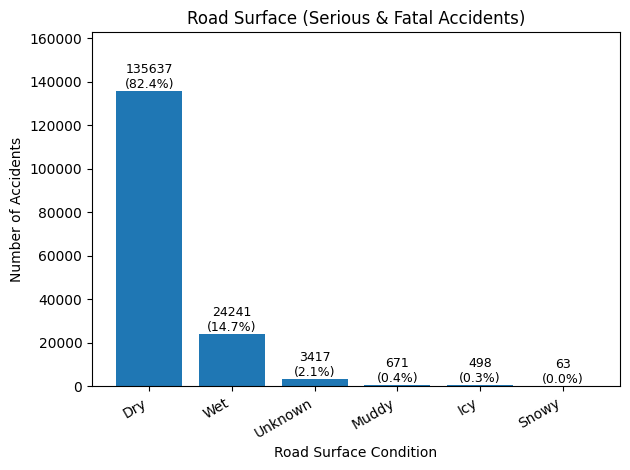

In [ ]:
sf = df[df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]
counts = sf['SURFACE_COND_DESC'].value_counts()
total = counts.sum()

plt.bar(counts.index, counts.values)
plt.title('Road Surface (Serious & Fatal Accidents)')
plt.xlabel('Road Surface Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(counts.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.ylim(0, counts.max() * 1.2)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


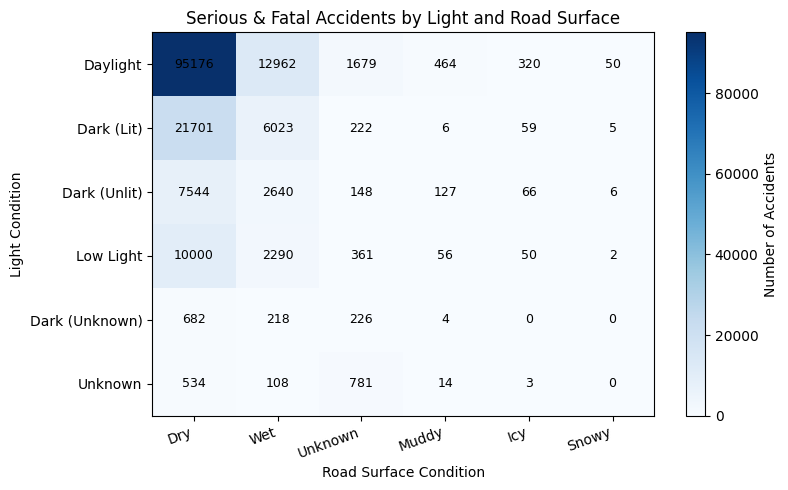

In [ ]:
sf = df[df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]
ct = pd.crosstab(sf['LIGHT_CONDITION'], sf['SURFACE_COND_DESC'])

light_order = ['Daylight', 'Dark (Lit)', 'Dark (Unlit)', 'Low Light', 'Dark (Unknown)', 'Unknown']
surf_order = ['Dry', 'Wet', 'Unknown', 'Muddy', 'Icy', 'Snowy']

ct = ct.reindex(index=[x for x in light_order if x in ct.index],
                columns=[x for x in surf_order if x in ct.columns])

plt.figure(figsize=(8,5))
plt.imshow(ct, cmap='Blues', aspect='auto')

plt.xticks(range(len(ct.columns)), ct.columns, rotation=20, ha='right')
plt.yticks(range(len(ct.index)), ct.index)

for i, row in enumerate(ct.values):
    for j, val in enumerate(row):
        plt.text(j, i, val, ha='center', va='center', fontsize=9)

plt.title('Serious & Fatal Accidents by Light and Road Surface')
plt.xlabel('Road Surface Condition')
plt.ylabel('Light Condition')
plt.colorbar(label='Number of Accidents')
plt.tight_layout()
plt.show()


In the charts we can see that most accidents, including serious ones, happen during the day and when the road is dry. These results may be caused by the fact that there is the most traffic during the day, so there are also more accidents. Australia is also not a very rainy, so most accidents happen when the road is dry.

Now we will look at the percentage of fatal and serious accidents in each category compared to the total number of accidents in that category.

**Comparison of Number vs Percentage of Serious/Fatal Accidents by Light Condition**

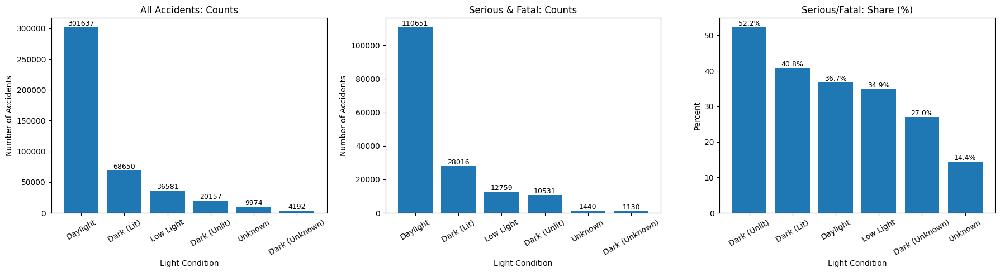

In [ ]:
all_counts = df['LIGHT_CONDITION'].value_counts()

sf = df[df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]
counts = sf['LIGHT_CONDITION'].value_counts()

tab = pd.crosstab(df['LIGHT_CONDITION'], df['SEVERITY'])
for c in ['Fatal accident', 'Serious injury accident']:
    tab[c] = tab.get(c, 0)

tab['Total'] = tab.sum(1)
share = ((tab['Fatal accident'] + tab['Serious injury accident']) / tab['Total'] * 100).round(2)
share = share.sort_values(ascending=False)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1 — ALL accidents
axes[0].bar(all_counts.index, all_counts.values)
axes[0].set_title('All Accidents: Counts')
axes[0].set_xlabel('Light Condition')
axes[0].set_ylabel('Number of Accidents')
axes[0].tick_params(axis='x', rotation=30)
for i, v in enumerate(all_counts.values):
    axes[0].text(i, v, f'{int(v)}', ha='center', va='bottom', fontsize=9)

# Plot 2 — Serious & Fatal Counts
axes[1].bar(counts.index, counts.values)
axes[1].set_title('Serious & Fatal: Counts')
axes[1].set_xlabel('Light Condition')
axes[1].set_ylabel('Number of Accidents')
axes[1].tick_params(axis='x', rotation=30)
for i, v in enumerate(counts.values):
    axes[1].text(i, v, f'{int(v)}', ha='center', va='bottom', fontsize=9)

# Plot 3 — Serious/Fatal Share
axes[2].bar(share.index, share.values)
axes[2].set_title('Serious/Fatal: Share (%)')
axes[2].set_xlabel('Light Condition')
axes[2].set_ylabel('Percent')
axes[2].tick_params(axis='x', rotation=30)
for i, v in enumerate(share.values):
    axes[2].text(i, v, f'{v:.1f}%', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


Most serious and fatal accidents happened in daylight, but the highest risk was in dark conditions without street lights. Poor lighting seems to increase the chance of severe accidents.

In Dark (Unlit) conditions, 52.2% means there were 10,531 serious or fatal accidents out of 20,157 total accidents.

**Focus on Dark (Unlit)**

**Accidents in Dark Unlit Conditions vs Location**

In [ ]:
# Imports needed to generate Basemap plots
!pip -q install geopandas contextily shapely pyproj
import geopandas as gpd, contextily as cx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from shapely.geometry import MultiPoint




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 96.8 MB/s eta 0:00:00


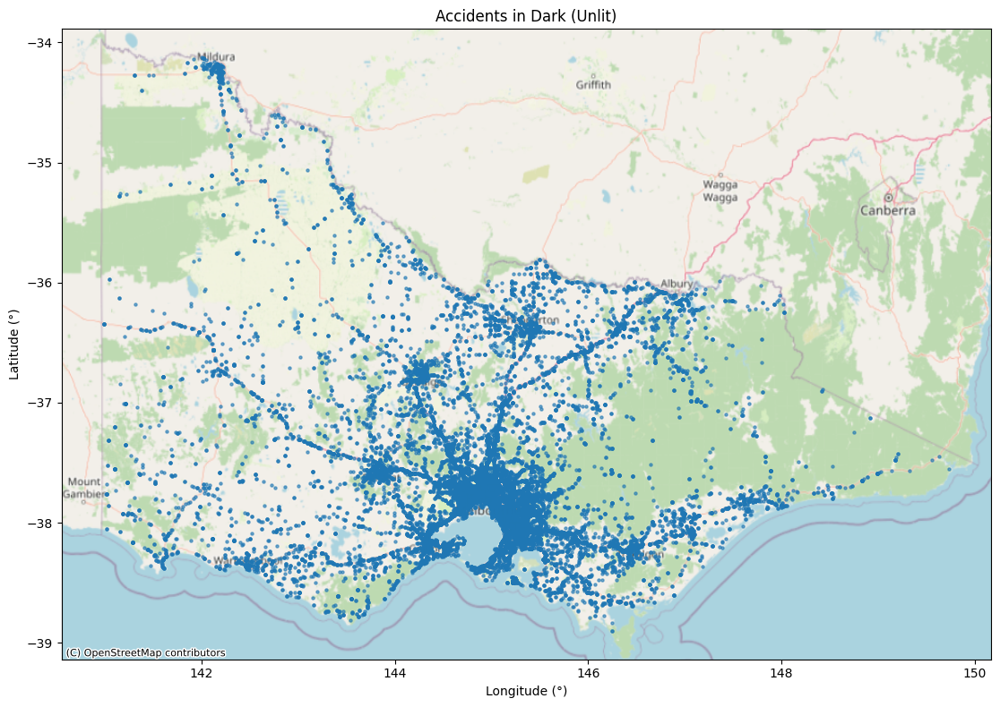

In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)'].dropna(subset=['LONGITUDE', 'LATITUDE'])
gdf = gpd.GeoDataFrame(du, geometry=gpd.points_from_xy(du.LONGITUDE, du.LATITUDE), crs=4326)

fig, ax = plt.subplots(figsize=(14,8))
gdf.plot(ax=ax, markersize=5, alpha=0.6)

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

plt.title('Accidents in Dark (Unlit)')
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.tight_layout()
plt.show()


**Accidents in Dark Unlit Conditions Across Specific Regions**

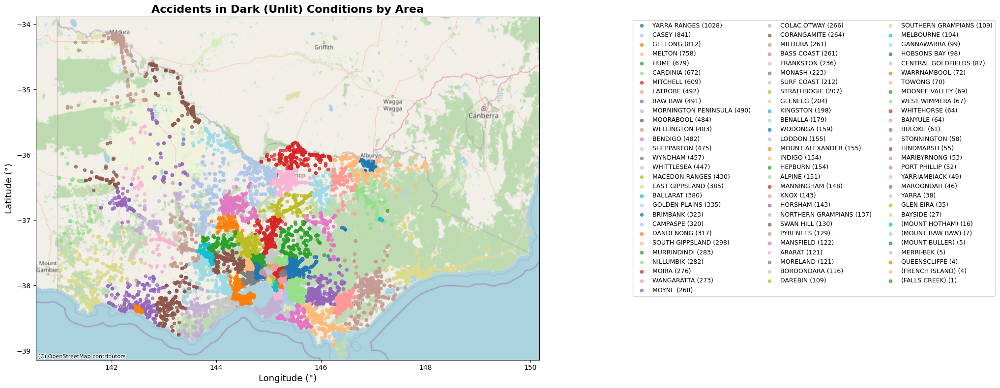

In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)'].dropna(subset=['LONGITUDE', 'LATITUDE'])
gdf = gpd.GeoDataFrame(du, geometry=gpd.points_from_xy(du.LONGITUDE, du.LATITUDE), crs=4326)

areas = du['LGA_NAME'].value_counts().index

fig, ax = plt.subplots(figsize=(18,8))
palette = list(plt.cm.tab20.colors)

for i, name in enumerate(areas):
    sel = gdf[gdf['LGA_NAME'] == name]
    sel.plot(ax=ax, markersize=20, alpha=0.7, color=palette[i % len(palette)],
             label=f"{name} ({len(sel)})")

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Accidents in Dark (Unlit) Conditions by Area', fontsize=16, weight='bold')
ax.set_xlabel('Longitude (°)', fontsize=13)
ax.set_ylabel('Latitude (°)', fontsize=13)
plt.legend(bbox_to_anchor=(1.18, 1), loc='upper left', fontsize=9, ncol=3, frameon=True)
plt.tight_layout()
plt.show()


**Finding areas with the Most Accidents in Dark Unlit Conditions (Top 10)**

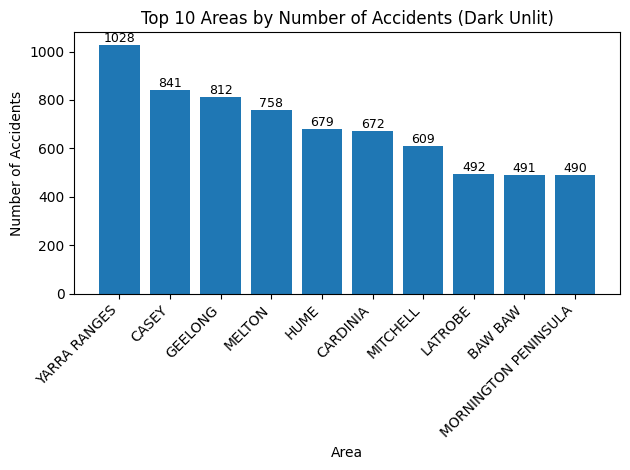

In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)']
areas = du['LGA_NAME'].value_counts().head(10)

plt.bar(areas.index, areas.values)
plt.title('Top 10 Areas by Number of Accidents (Dark Unlit)')
plt.xlabel('Area')
plt.ylabel('Number of Accidents')

for i, v in enumerate(areas.values):
    plt.text(i, v, str(v), ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


**Identified Regions Marked on the Map**

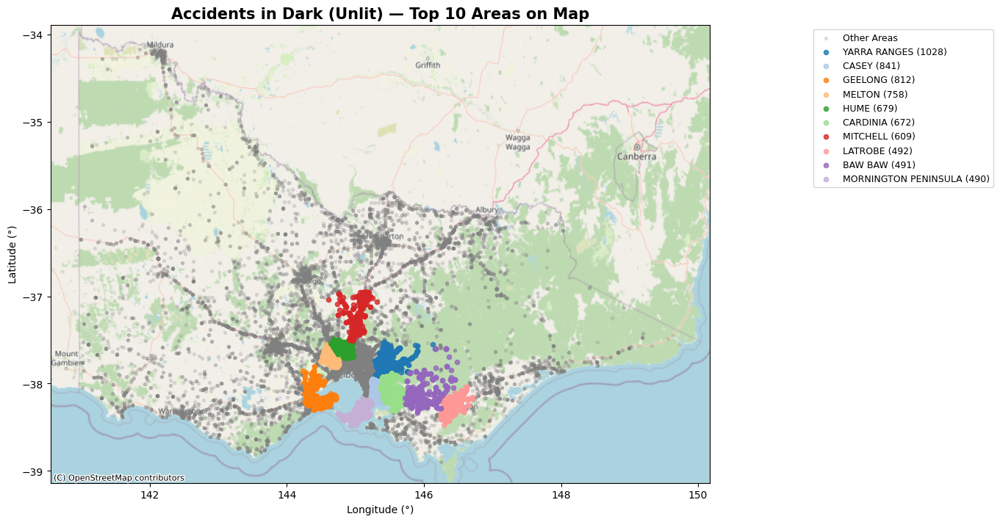

In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)'].dropna(subset=['LONGITUDE', 'LATITUDE'])
gdf = gpd.GeoDataFrame(du, geometry=gpd.points_from_xy(du.LONGITUDE, du.LATITUDE), crs=4326)

top_areas = du['LGA_NAME'].value_counts().head(10).index

fig, ax = plt.subplots(figsize=(14, 10))

gdf[~gdf['LGA_NAME'].isin(top_areas)].plot(ax=ax, color='gray', markersize=8, alpha=0.2, label='Other Areas')

palette = list(plt.cm.tab20.colors)
for i, name in enumerate(top_areas):
    sel = gdf[gdf['LGA_NAME'] == name]
    sel.plot(ax=ax, markersize=20, color=palette[i % len(palette)], alpha=0.8,
             label=f"{name} ({len(sel)})")

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Accidents in Dark (Unlit) — Top 10 Areas on Map', fontsize=15, weight='bold')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=9, frameon=True)
plt.tight_layout()
plt.show()


In the Top 10 areas with the most accidents in Dark Unlit conditions, some places are part of Greater Melbourne (Casey, Melton, Hume, Cardinia). However, the biggest danger is in regions outside the city, such as Yarra Ranges and Geelong, where the roads are less lit and more difficult to drive on.

Yarra Ranges has the most Dark Unlit accidents because it is a large, rural and forested area with many long, winding roads that have little or no street lighting.

<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRRja4LNfStVr9cbgqgAXvu7m4L1fANDQ2gzQ&s" width="500">


**Zoom on the Region Near Port Phillip Bay**

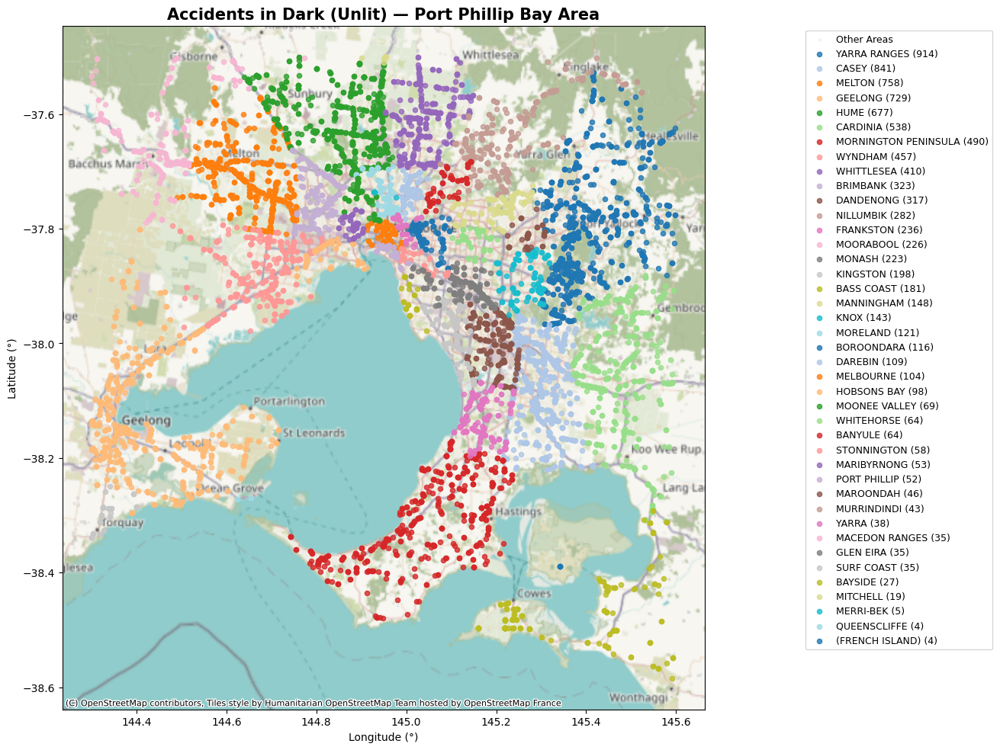

In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)'].dropna(subset=['LONGITUDE', 'LATITUDE'])
gdf = gpd.GeoDataFrame(du, geometry=gpd.points_from_xy(du.LONGITUDE, du.LATITUDE), crs=4326)

bbox = (144.3, 145.6, -38.6, -37.5)
focus = gdf[gdf.LONGITUDE.between(bbox[0], bbox[1]) & gdf.LATITUDE.between(bbox[2], bbox[3])]

fig, ax = plt.subplots(figsize=(14, 10))

gdf.loc[~gdf.index.isin(focus.index)].plot(ax=ax, color='lightgray', markersize=6, alpha=0.2, label='Other Areas')

areas = focus['LGA_NAME'].value_counts().index
palette = list(plt.cm.tab20.colors)
for i, name in enumerate(areas):
    sel = focus[focus['LGA_NAME'] == name]
    sel.plot(ax=ax, markersize=20, alpha=0.8, color=palette[i % len(palette)],
             label=f"{name} ({len(sel)})")

minx, miny, maxx, maxy = focus.total_bounds
padx, pady = (maxx - minx) * 0.05, (maxy - miny) * 0.05
ax.set_xlim(minx - padx, maxx + padx)
ax.set_ylim(miny - pady, maxy + pady)

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.HOT)

ax.set_title('Accidents in Dark (Unlit) — Port Phillip Bay Area', fontsize=15, weight='bold')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=9, frameon=True)
plt.tight_layout()
plt.show()


**Unlit Roads with the Highest Number of Accidents**

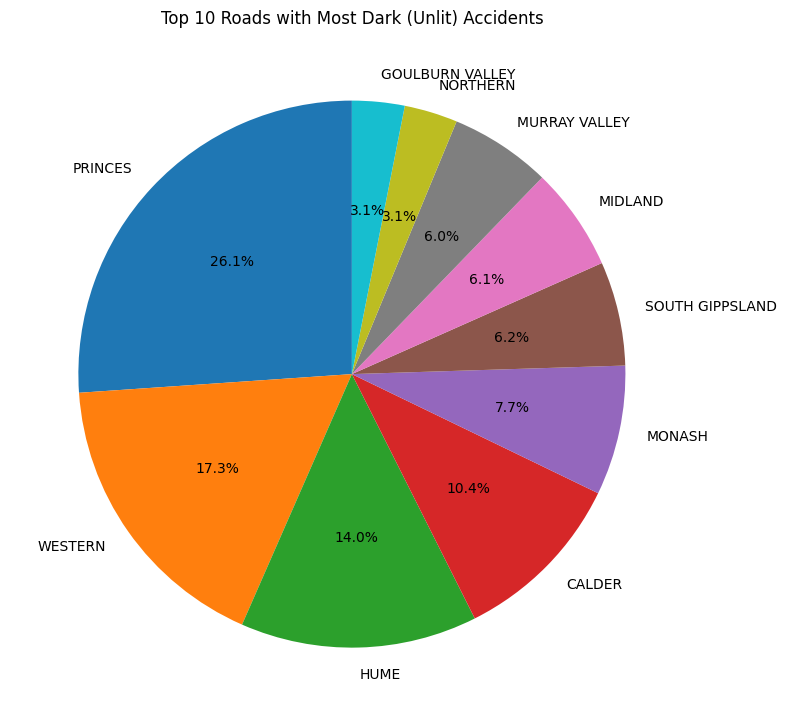

In [ ]:
roads = df[df['LIGHT_CONDITION']=='Dark (Unlit)'].groupby('ROAD_NAME', dropna=False).size().sort_values(ascending=False).head(10)
plt.figure(figsize=(8,8))
plt.pie(roads.values, labels=roads.index, autopct='%1.1f%%', startangle=90)
plt.title('Top 10 Roads with Most Dark (Unlit) Accidents')
plt.tight_layout()
plt.show()


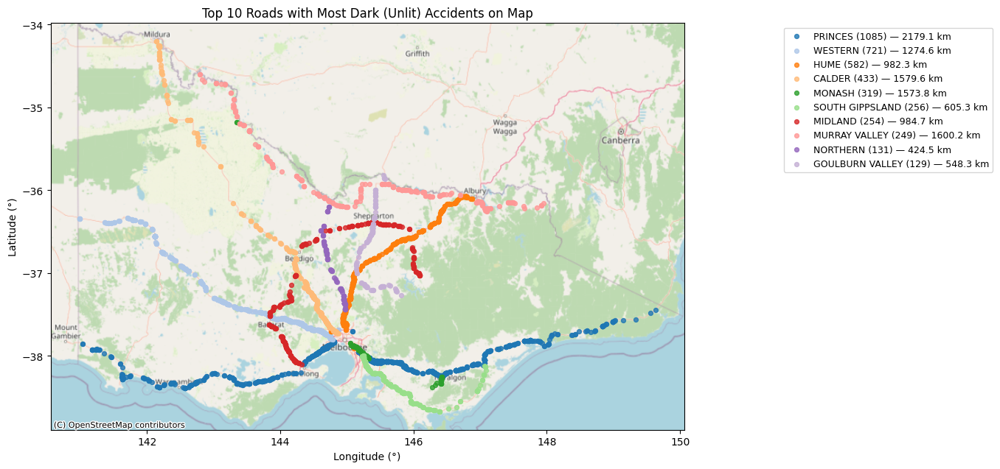

In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)'].dropna(subset=['LONGITUDE', 'LATITUDE'])
roads = du.groupby('ROAD_NAME', dropna=False).size().sort_values(ascending=False).head(10)
top_roads = roads.index

gdf = gpd.GeoDataFrame(du, geometry=gpd.points_from_xy(du.LONGITUDE, du.LATITUDE), crs=4326)
gdf_m = gdf.to_crs(3857)

lengths = {}
for r in top_roads:
    sel = gdf_m[gdf_m.ROAD_NAME == r]
    if len(sel) > 1:
        line = MultiPoint(sel.geometry.tolist()).envelope
        lengths[r] = line.length / 1000
    else:
        lengths[r] = 0

palette = list(plt.cm.tab20.colors)
fig, ax = plt.subplots(figsize=(14, 10))

for i, r in enumerate(top_roads):
    color = palette[i % len(palette)]
    sel = gdf[gdf.ROAD_NAME == r]
    sel.plot(ax=ax, markersize=18, alpha=0.8, color=color,
             label=f'{r} ({len(sel)}) — {lengths[r]:.1f} km')

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Top 10 Roads with Most Dark (Unlit) Accidents on Map')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()


**Top 5 Most Dangerous Unlit Locations**

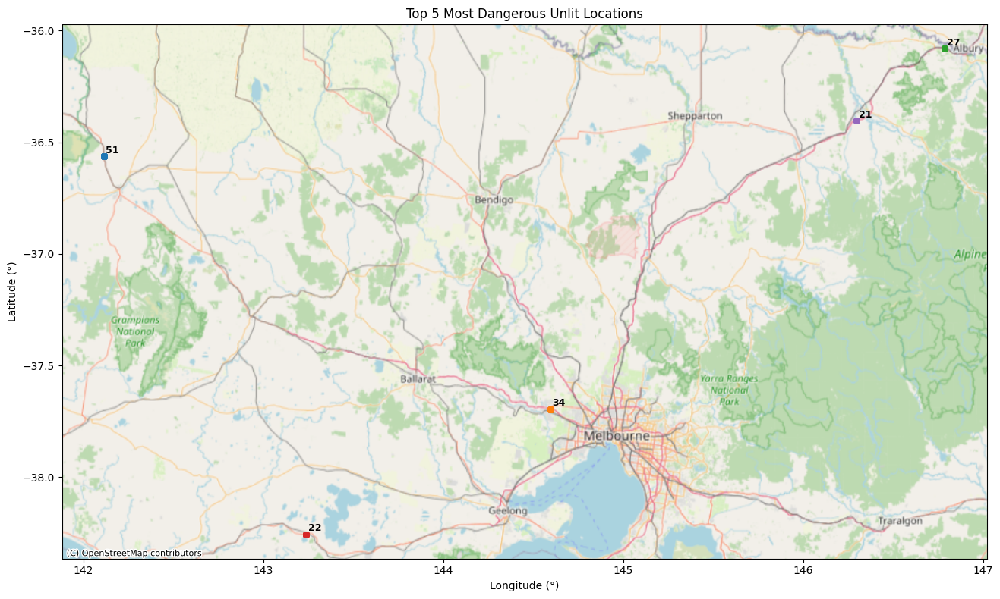

Google Maps links:

(-36.5625, 142.1158) -> https://www.google.com/maps?q=-36.5625,142.1158
(-37.6953, 144.5957) -> https://www.google.com/maps?q=-37.6953,144.5957
(-36.0815, 146.7871) -> https://www.google.com/maps?q=-36.0815,146.7871
(-38.2558, 143.2392) -> https://www.google.com/maps?q=-38.2558,143.2392
(-36.4032, 146.2971) -> https://www.google.com/maps?q=-36.4032,146.2971


In [ ]:
du = df[df['LIGHT_CONDITION'] == 'Dark (Unlit)'].dropna(subset=['LONGITUDE', 'LATITUDE'])
du['loc'] = du['LONGITUDE'].round(4).astype(str) + '|' + du['LATITUDE'].round(4).astype(str)

top5 = du['loc'].value_counts().head(5)
gdf = gpd.GeoDataFrame(du, geometry=gpd.points_from_xy(du.LONGITUDE, du.LATITUDE), crs=4326)

palette = list(plt.cm.tab10.colors)
fig, ax = plt.subplots(figsize=(14, 8))

for i, key in enumerate(top5.index):
    color = palette[i % len(palette)]
    sel = gdf[gdf['loc'] == key]
    sel.plot(ax=ax, markersize=30, alpha=0.85, color=color)
    lon, lat = map(float, key.split('|'))
    ax.text(lon + 0.01, lat + 0.005, str(int(top5.loc[key])),
            fontsize=9, fontweight='bold', color='black', ha='left', va='bottom')

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Top 5 Most Dangerous Unlit Locations')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.tight_layout()
plt.show()

print("Google Maps links:\n")
for i, key in enumerate(top5.index):
    color = palette[i % len(palette)]
    lon, lat = key.split('|')
    r, g, b = [int(255 * c) for c in color]
    print(f"\033[38;2;{r};{g};{b}m({lat}, {lon}) -> https://www.google.com/maps?q={lat},{lon}\033[0m")


Because more than half of all accidents without street lighting at night ended with a serious injury or death, we decided to study these data in relation to the place of the accident. First, we put all serious and fatal accidents on a map of the state of Victoria in Australia. Unfortunately, because there were so many accidents, we could not see any clear patterns. For this reason, we marked each region with a different color and then selected the 10 regions with the highest number of accidents.

The highest number of serious and fatal accidents happens in the Yarra Ranges region, shown in blue on the charts. We also checked which roads had the most dangerous accidents. It turned out that more than 26% of them happened on the Princes road. We also marked the roads on the map, and it is clear that Princes is the longest road, which may explain why it has so many accidents.

To check this, we estimated the approximate length of each road by measuring the rectangular area that covers all accident points on a given road. This helped us understand the possible length of each road. An interesting example is the Hume road. It is shorter than many other roads, but it is still in the top three when it comes to serious or fatal accidents. A similar situation appears for the Western road, which is the second most dangerous road even though it is not very long.

We also decided to look at specific places with many accidents. After looking at all the maps, we wanted to find several locations with the most dangerous situations. These are places where changes in infrastructure could help — for example, improving the road layout, adding signs, or especially adding street lighting.

We selected five such places. We grouped accidents based on coordinates rounded to four decimal places (which creates squares of about 10 meters). Then we counted how many accidents happened in each square and chose the five most dangerous places. We also checked these locations in Google Maps, and the links are under the chart.

All these places are far from towns, some near train tracks, and they do not have any lighting. These are small, empty roads where people often drive fast. Many drivers may feel safe to speed because there is almost no traffic. The lack of lighting also makes visibility worse, and this is probably why these places have the highest number of fatal accidents.

## **Weather Conditions**

**Data preprocessing**

In [ ]:
weather_cols = ['ATMOSPH_COND', 'ATMOSPH_COND_DESC', 'ATMOSPH_COND_SEQ']

missing_weather = df[weather_cols].isna().sum()
print("Missing values in weather-related columns:\n")
print(missing_weather)


Missing values in weather-related columns:

ATMOSPH_COND         0
ATMOSPH_COND_DESC    0
ATMOSPH_COND_SEQ     0
dtype: int64


**Road Accidents by Type of Weather**

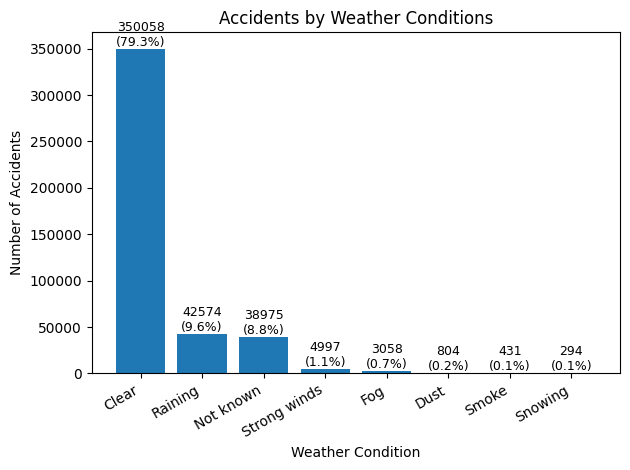

In [ ]:
weather = df['ATMOSPH_COND_DESC'].value_counts()
total = weather.sum()

plt.bar(weather.index, weather.values)
plt.title('Accidents by Weather Conditions')
plt.xlabel('Weather Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(weather.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


**Serious and Fatal Road Accidents by Weather Condition**

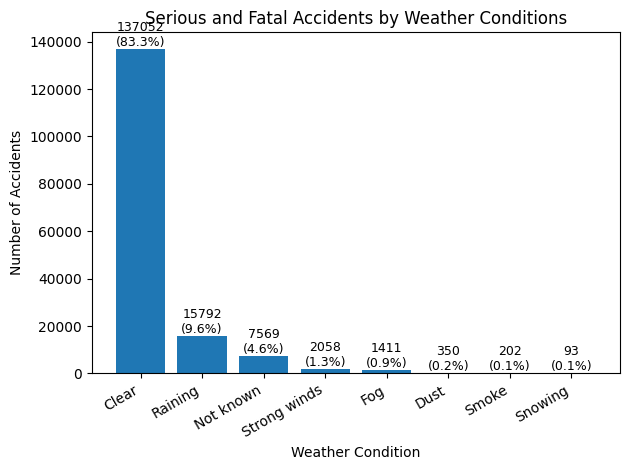

In [ ]:
sf = df[df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]
weather = sf['ATMOSPH_COND_DESC'].value_counts()
total = weather.sum()

plt.bar(weather.index, weather.values)
plt.title('Serious and Fatal Accidents by Weather Conditions')
plt.xlabel('Weather Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(weather.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


**Number and percentage of serious and fatal accidents in each weather condition**

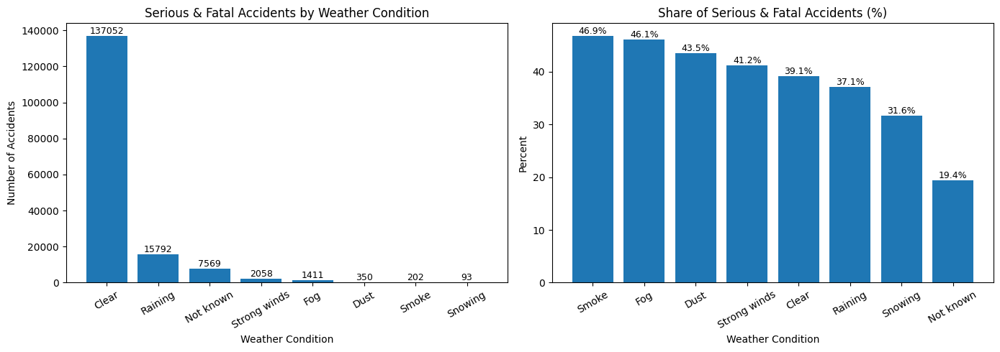

In [ ]:
sf = df[df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident'])]
counts = sf['ATMOSPH_COND_DESC'].value_counts()

tab = pd.crosstab(df['ATMOSPH_COND_DESC'], df['SEVERITY'])
for c in ['Fatal accident', 'Serious injury accident']:
    tab[c] = tab.get(c, 0)
tab['Total'] = tab.sum(1)
share = ((tab['Fatal accident'] + tab['Serious injury accident']) / tab['Total'] * 100).round(2)
share = share.sort_values(ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(14,5))

axes[0].bar(counts.index, counts.values)
axes[0].set_title('Serious & Fatal Accidents by Weather Condition')
axes[0].set_xlabel('Weather Condition')
axes[0].set_ylabel('Number of Accidents')
axes[0].tick_params(axis='x', rotation=30)
for i, v in enumerate(counts.values):
    axes[0].text(i, v, f'{int(v)}', ha='center', va='bottom', fontsize=9)

axes[1].bar(share.index, share.values)
axes[1].set_title('Share of Serious & Fatal Accidents (%)')
axes[1].set_xlabel('Weather Condition')
axes[1].set_ylabel('Percent')
axes[1].tick_params(axis='x', rotation=30)
for i, v in enumerate(share.values):
    axes[1].text(i, v, f'{v:.1f}%', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


Most serious and fatal accidents happen in clear weather because there are more cars on the road.
However, accidents in smoke, fog, and dust are the most dangerous, as low visibility increases the risk of severe crashes.
This means that even if such weather is rare, it is very risky for drivers.

**Accidents in Different Weather Conditions across Victoria**

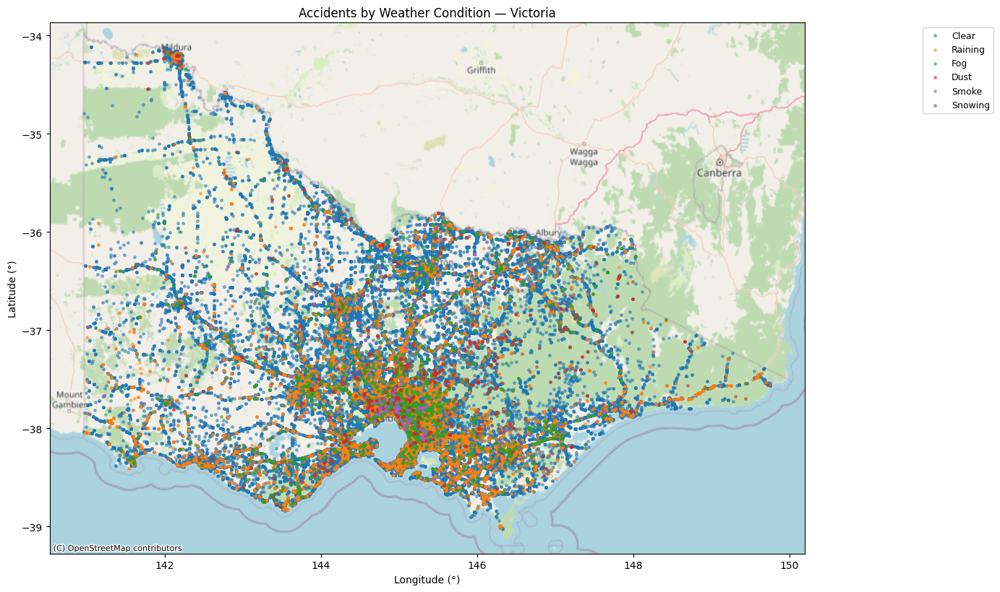

In [ ]:
w = df.dropna(subset=['LONGITUDE', 'LATITUDE'])[['LONGITUDE','LATITUDE','ATMOSPH_COND_DESC']].copy()
gdf = gpd.GeoDataFrame(w, geometry=gpd.points_from_xy(w.LONGITUDE, w.LATITUDE), crs=4326)

cats = [c for c in ['Clear','Raining','Fog','Strong Winds','Dust','Smoke','Snowing','Not Known'] if c in gdf.ATMOSPH_COND_DESC.unique()]
palette = list(plt.cm.tab10.colors)

fig, ax = plt.subplots(figsize=(14, 10))
for i, c in enumerate(cats):
    gdf[gdf.ATMOSPH_COND_DESC == c].plot(ax=ax, markersize=6, alpha=0.5, color=palette[i % len(palette)], label=c)

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title('Accidents by Weather Condition — Victoria')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()


**Accidents in poor visibility conditions across Victoria**

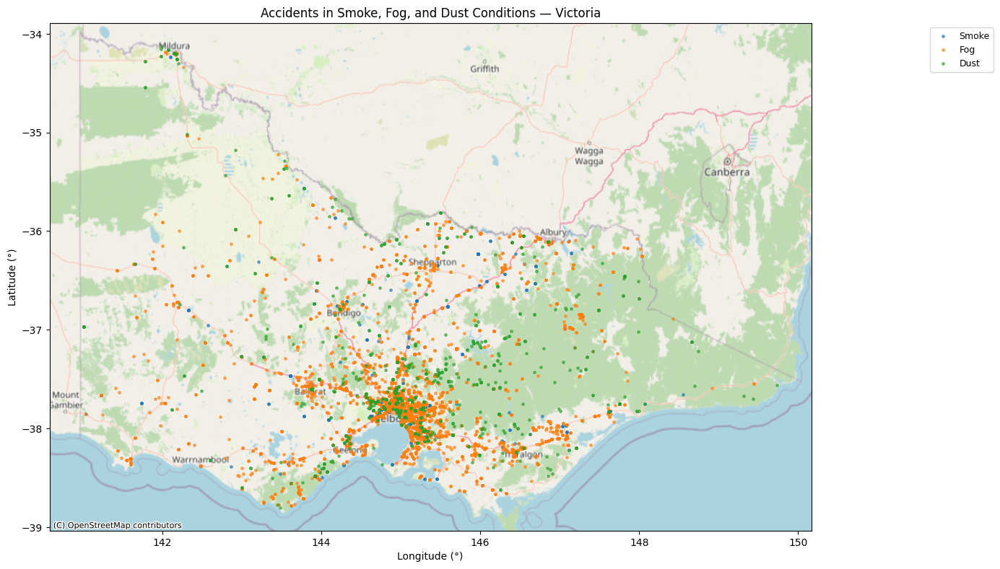

In [ ]:
w = df.dropna(subset=['LONGITUDE', 'LATITUDE'])[['LONGITUDE','LATITUDE','ATMOSPH_COND_DESC']].copy()
gdf = gpd.GeoDataFrame(w, geometry=gpd.points_from_xy(w.LONGITUDE, w.LATITUDE), crs=4326)

cats = [c for c in ['Smoke', 'Fog', 'Dust'] if c in gdf.ATMOSPH_COND_DESC.unique()]
palette = list(plt.cm.tab10.colors)

fig, ax = plt.subplots(figsize=(14, 10))
for i, c in enumerate(cats):
    gdf[gdf.ATMOSPH_COND_DESC == c].plot(ax=ax, markersize=6, alpha=0.6, color=palette[i % len(palette)], label=c)

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title('Accidents in Smoke, Fog, and Dust Conditions — Victoria')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()


The map shows accidents in fog, smoke, and dust conditions across Victoria.
Most fog accidents are around Melbourne and in the southeast.
There are also many green dots (Dust) in the eastern part of the state, which means that dusty conditions cause more accidents there.

**A Closer Look at Rain**

**Accidents in Rain by Light Condition**

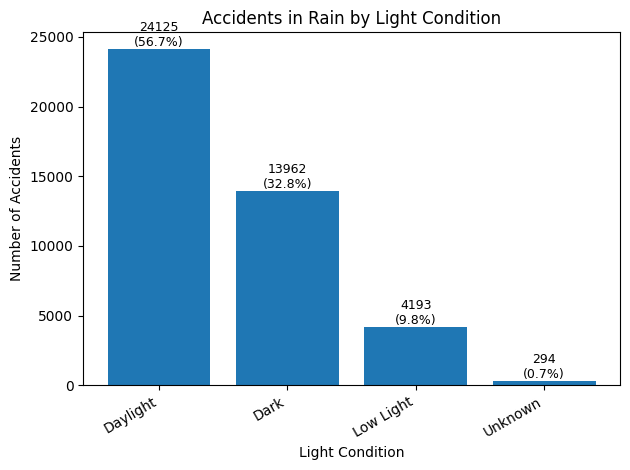

In [ ]:
rain = df[df['ATMOSPH_COND_DESC'] == 'Raining'].copy()
rain['LIGHT_CONDITION'] = rain['LIGHT_CONDITION'].replace({
    'Dark (Lit)': 'Dark',
    'Dark (Unlit)': 'Dark',
    'Dark (Unknown)': 'Dark'
})

counts = rain['LIGHT_CONDITION'].value_counts()
total = counts.sum()

plt.bar(counts.index, counts.values)
plt.title('Accidents in Rain by Light Condition')
plt.xlabel('Light Condition')
plt.ylabel('Number of Accidents')

for i, v in enumerate(counts.values):
    pct = v / total * 100
    plt.text(i, v, f'{v}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


Most accidents in rain happen during daylight, but a large number still occur in dark conditions.

**Severity of Rainy-Weather Accidents by Light Condition**

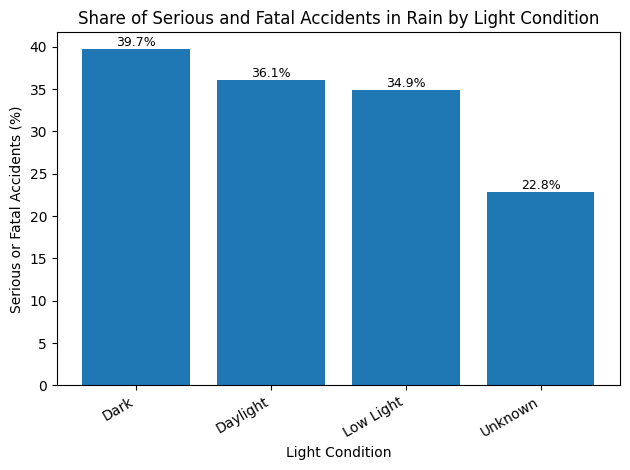

In [ ]:
rain = df[df['ATMOSPH_COND_DESC'] == 'Raining'].copy()
rain['LIGHT_CONDITION'] = rain['LIGHT_CONDITION'].replace({
    'Dark (Lit)': 'Dark',
    'Dark (Unlit)': 'Dark',
    'Dark (Unknown)': 'Dark'
})

tab = pd.crosstab(rain['LIGHT_CONDITION'], rain['SEVERITY'])
for c in ['Fatal accident', 'Serious injury accident']:
    tab[c] = tab.get(c, 0)

tab['Total'] = tab.sum(axis=1)
tab['Serious_or_Fatal_%'] = ((tab['Fatal accident'] + tab['Serious injury accident']) / tab['Total'] * 100).round(2)
tab = tab.sort_values('Serious_or_Fatal_%', ascending=False)

plt.bar(tab.index, tab['Serious_or_Fatal_%'])
plt.title('Share of Serious and Fatal Accidents in Rain by Light Condition')
plt.xlabel('Light Condition')
plt.ylabel('Serious or Fatal Accidents (%)')

for i, v in enumerate(tab['Serious_or_Fatal_%']):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', fontsize=9)

plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


About 40% of rainy-weather accidents are serious or fatal in all light conditions, so light does not change the risk very much when it is raining.

**Top places with the highest number of accidents in rain**

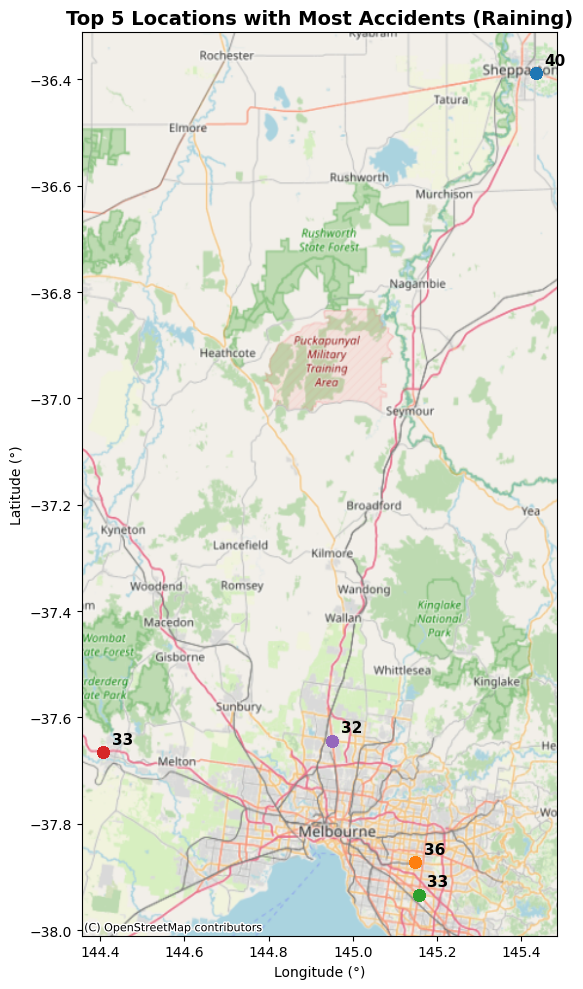

Google Maps links:

(-36.3889, 145.4341) -> https://www.google.com/maps?q=-36.3889,145.4341
(-37.8722, 145.1484) -> https://www.google.com/maps?q=-37.8722,145.1484
(-37.9332, 145.1569) -> https://www.google.com/maps?q=-37.9332,145.1569
(-37.6655, 144.4075) -> https://www.google.com/maps?q=-37.6655,144.4075
(-37.6434, 144.9515) -> https://www.google.com/maps?q=-37.6434,144.9515


In [ ]:
sm = df[df['ATMOSPH_COND_DESC'] == 'Raining'].dropna(subset=['LONGITUDE', 'LATITUDE'])
sm['loc'] = sm['LONGITUDE'].round(4).astype(str) + '|' + sm['LATITUDE'].round(4).astype(str)

top5 = sm['loc'].value_counts().head(5)

gdf = gpd.GeoDataFrame(
    sm,
    geometry=gpd.points_from_xy(sm.LONGITUDE, sm.LATITUDE),
    crs=4326
)

palette = list(plt.cm.tab10.colors)
fig, ax = plt.subplots(figsize=(14, 10))

for i, key in enumerate(top5.index):
    color = palette[i % len(palette)]
    sel = gdf[gdf['loc'] == key]
    sel.plot(ax=ax, markersize=60, alpha=0.9, color=color)

    lon, lat = map(float, key.split('|'))
    ax.text(
        lon + 0.02,
        lat + 0.01,
        str(int(top5.loc[key])),
        fontsize=11,
        fontweight='bold',
        color='black',
        ha='left',
        va='bottom'
    )

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Top 5 Locations with Most Accidents (Raining)', fontsize=14, weight='bold')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.tight_layout()
plt.show()

print("Google Maps links:\n")
for i, key in enumerate(top5.index):
    color = palette[i % len(palette)]
    lon, lat = key.split('|')
    r, g, b = [int(255 * c) for c in color]

    print(
        f"\033[38;2;{r};{g};{b}m"
        f"({lat}, {lon}) -> https://www.google.com/maps?q={lat},{lon}"
        f"\033[0m"
    )



The analysis shows that these five places are areas with a high risk of accidents during rain. Each location has conditions that make crashes more likely, especially when the road is wet and visibility is lower.

• (-36.3889, 145.4341) - Blue – This is a regional road with long straight sections, where drivers often go faster and can lose control in the rain.

• (-37.8722, 145.1484) - Orange – This part of south-east Melbourne has heavy traffic, many intersections and narrow streets, which become more dangerous during rain.

• (-37.9332, 145.1569) - Green – This urban area has many intersections, and rain makes it harder for drivers to judge distance and speed.

• (-37.6655, 144.4075) – Red - This western area has high-speed roads where wet surfaces and sudden braking can easily cause skidding and collisions.

• (-37.6434, 144.9515) – Purple -  This part of north Melbourne has busy city traffic and many lane changes, which become riskier in rainy weather.



**Top 5 places with serious or fatal accidents in rain**

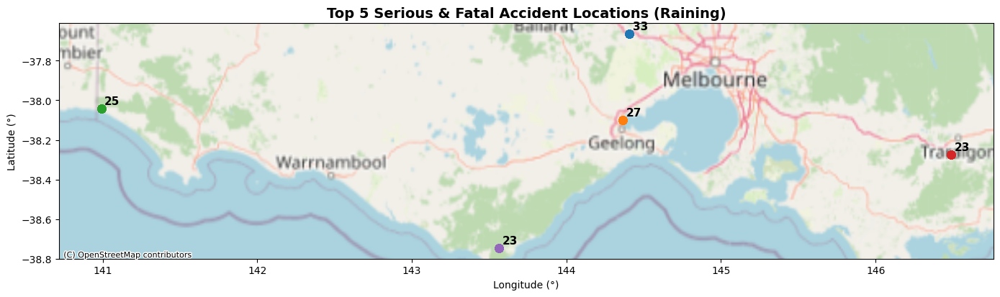

Google Maps links:

(-37.6655, 144.4075) -> https://www.google.com/maps?q=-37.6655,144.4075
(-38.0997, 144.3646) -> https://www.google.com/maps?q=-38.0997,144.3646
(-38.0429, 140.9918) -> https://www.google.com/maps?q=-38.0429,140.9918
(-38.2735, 146.4879) -> https://www.google.com/maps?q=-38.2735,146.4879
(-38.746, 143.5639) -> https://www.google.com/maps?q=-38.746,143.5639


In [ ]:
sm = df[
    (df['ATMOSPH_COND_DESC'] == 'Raining') &
    (df['SEVERITY'].isin(['Fatal accident', 'Serious injury accident']))
].dropna(subset=['LONGITUDE', 'LATITUDE'])

sm['loc'] = sm['LONGITUDE'].round(4).astype(str) + '|' + sm['LATITUDE'].round(4).astype(str)

top5 = sm['loc'].value_counts().head(5)

gdf = gpd.GeoDataFrame(sm, geometry=gpd.points_from_xy(sm.LONGITUDE, sm.LATITUDE), crs=4326)

palette = list(plt.cm.tab10.colors)
fig, ax = plt.subplots(figsize=(14, 10))

for i, key in enumerate(top5.index):
    color = palette[i % len(palette)]
    sel = gdf[gdf['loc'] == key]
    sel.plot(ax=ax, markersize=60, alpha=0.9, color=color)

    lon, lat = map(float, key.split('|'))
    ax.text(
        lon + 0.02, lat + 0.01,
        str(int(top5.loc[key])),
        fontsize=11, fontweight='bold',
        color='black', ha='left', va='bottom'
    )

cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Top 5 Serious & Fatal Accident Locations (Raining)', fontsize=14, weight='bold')
ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
plt.tight_layout()
plt.show()

print("Google Maps links:\n")
for i, key in enumerate(top5.index):
    color = palette[i % len(palette)]
    lon, lat = key.split('|')
    r, g, b = [int(255 * c) for c in color]

    print(
        f"\033[38;2;{r};{g};{b}m"
        f"({lat}, {lon}) -> https://www.google.com/maps?q={lat},{lon}"
        f"\033[0m"
    )


These locations are mostly on regional roads and coastal areas, where drivers often travel faster and rain quickly makes the conditions worse. The roads are long and open, and in rain they become slippery, visibility is lower, and driving is more difficult.

(-37.6655, 144.4075) – Blue - This area is on western access roads, where high speed and a wet surface increase the chance of serious crashes.

(-38.0997, 144.3646) – Orange - A route near Geelong, often used by drivers leaving the city; in rain the road becomes very slippery.

(-38.0429, 140.9918) – Green - A coastal area with long empty sections, where visibility drops in rain and drivers react later.

(-38.2735, 146.4879) – Red - The eastern part of the region, where regional and local traffic mix, creating difficult conditions during rain.

(-38.7460, 143.5639) – Purple - A coastal road with curves and changing terrain, which becomes especially challenging in rainy weather.

**What could be done to reduce accidents in both cases?**

• Improve road drainage to stop water from collecting.

• Replace or roughen the road surface to increase grip in wet weather.

• Add better lighting in high-risk areas.

• Use clearer and more visible road signs, especially at intersections.

• Introduce lower speed limits during rain, for example weather-based limits.

• Redesign dangerous intersections or add roundabouts.

• Run public campaigns to remind drivers to slow down when it rains.

## **Time & Human Aspect**

This section aims to explore how time and human features can impact accidents.

**Data preprocessing**

In [ ]:
datasets = {
    "accidents": accidents,
    "atmos": atmos,
    "person": person,
    "road_surface": road_surface}

for name, df_ in datasets.items():
    print(f"\n{name.upper()} — shape: {df_.shape}")
    missing = df_.isna().sum()
    missing = missing[missing > 0]
    if missing.empty:
        print(" No missing values")
    else:
        percent = (missing / len(df_) * 100).round(2)
        print(pd.DataFrame({"missing": missing, "%": percent}).sort_values(by="%", ascending=False))



ACCIDENTS — shape: (185722, 52)
                  missing      %
SRNS               131069  70.57
RMA                  8701   4.68
DIVIDED              8701   4.68
ROAD_TYPE            2469   1.33
STAT_DIV_NAME        1009   0.54
DEG_URBAN_NAME        988   0.53
ROAD_NAME             248   0.13
ROAD_ROUTE_1           85   0.05
LGA_NAME               90   0.05
LATITUDE               85   0.05
DTP_REGION             85   0.05
LONGITUDE              85   0.05
VICGRID_X              85   0.05
VICGRID_Y              85   0.05
NO_OF_VEHICLES          9   0.00
HEAVYVEHICLE            9   0.00
PT_VEHICLE              9   0.00
PASSENGERVEHICLE        9   0.00
MOTORCYCLE              9   0.00

ATMOS — shape: (190417, 4)
 No missing values

PERSON — shape: (438984, 14)
                  missing      %
TAKEN_HOSPITAL     283018  64.47
LICENCE_STATE      109639  24.98
EJECTED_CODE        26225   5.97
VEHICLE_ID          17550   4.00
SEATING_POSITION    17578   4.00
SEX                    35   0.01

**Charts**

**Time factor**

In [ ]:
# Cleaning for charts with time

# Convert date and extract weekday
accidents["ACCIDENT_DATE"] = pd.to_datetime(accidents["ACCIDENT_DATE"], errors="coerce")
accidents["ACCIDENT_DOW_NAME"] = accidents.get("DAY_WEEK_DESC", accidents["ACCIDENT_DATE"].dt.day_name()).str[:3]

# Extract hour from ACCIDENT_TIME
def extract_hour(x):
    s = str(x)
    if ":" in s:
        return int(s.split(":")[0])
    if s.isdigit() and len(s) in (3, 4):
        return int(s[:-2])
    return np.nan

accidents["ACCIDENT_HOUR"] = accidents["ACCIDENT_TIME"].apply(extract_hour)

# Season (Australia)
accidents["ACCIDENT_MONTH"] = accidents["ACCIDENT_DATE"].dt.month
accidents["SEASON"] = np.select(
    [accidents["ACCIDENT_MONTH"].isin([12,1,2]),
     accidents["ACCIDENT_MONTH"].isin([3,4,5]),
     accidents["ACCIDENT_MONTH"].isin([6,7,8])],
    ["Summer", "Autumn", "Winter"],
    default="Spring"
)


**Accidents by hour of day**

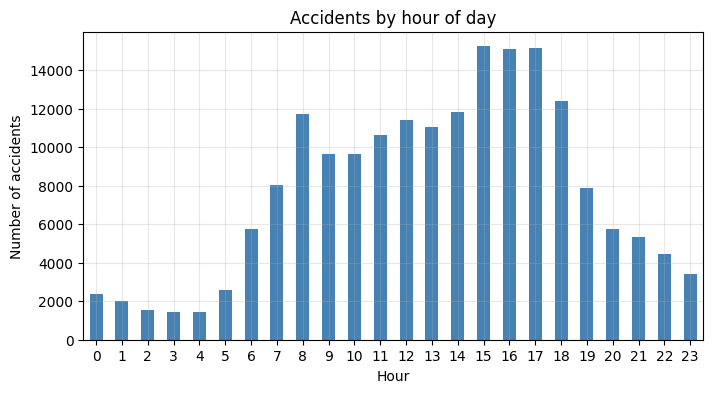

In [ ]:
# Bar chart - number of accidents by hour
hourly = accidents.dropna(subset=["ACCIDENT_HOUR"]).groupby("ACCIDENT_HOUR").size().reindex(range(24), fill_value=0)
hourly.plot(kind="bar", figsize=(8,4), color="steelblue", title="Accidents by hour of day")
plt.xlabel("Hour")
plt.ylabel("Number of accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()

The chart shows the number of road accidents by hour of the day. Most accidents occur in the afternoon, especially between 3 PM and 5 PM likely due to heavy traffic during commuting hours. Early morning and night hours have noticeably fewer accidents.

**Accidents by day of week**

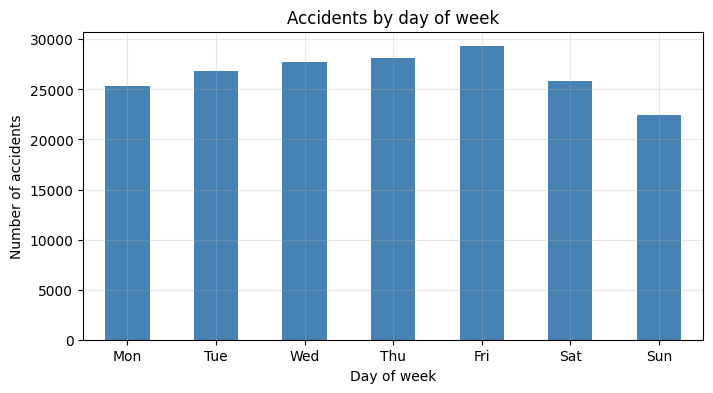

In [ ]:
# Bar chart - number of accidents by day of week
day_order = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]

daily = (accidents.dropna(subset=["ACCIDENT_DOW_NAME"])
         .groupby("ACCIDENT_DOW_NAME")
         .size()
         .reindex(day_order, fill_value=0))

daily.plot(kind="bar", figsize=(8,4), color="steelblue", title="Accidents by day of week")
plt.xlabel("Day of week")
plt.ylabel("Number of accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()

The chart shows the total number of road accidents for each day of the week. Accidents occur most frequently on weekdays, especially on Friday, which may be related to increased traffic at the start of weekend. Fewer accidents can be seen on weekends.

**Accidents by season**

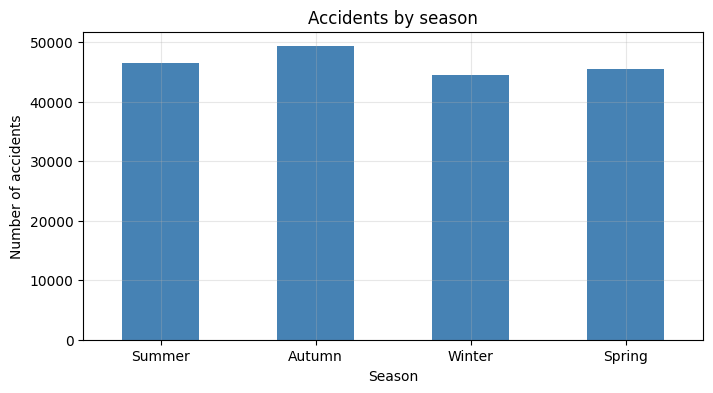

In [ ]:
# Bar chart - number of accidents by season
season_order = ["Summer", "Autumn", "Winter", "Spring"]

seasonal = (accidents.dropna(subset=["SEASON"])
            .groupby("SEASON")
            .size()
            .reindex(season_order, fill_value=0))

seasonal.plot(kind="bar", figsize=(8,4), color="steelblue", title="Accidents by season")
plt.xlabel("Season")
plt.ylabel("Number of accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()



The chart shows the total number of road accidents by season. The number of accidents is slightly higher during summer and autumn, which may be related to increased travel and holiday traffic, while winter and spring have fewer recorded accidents.


**Accidents by year**

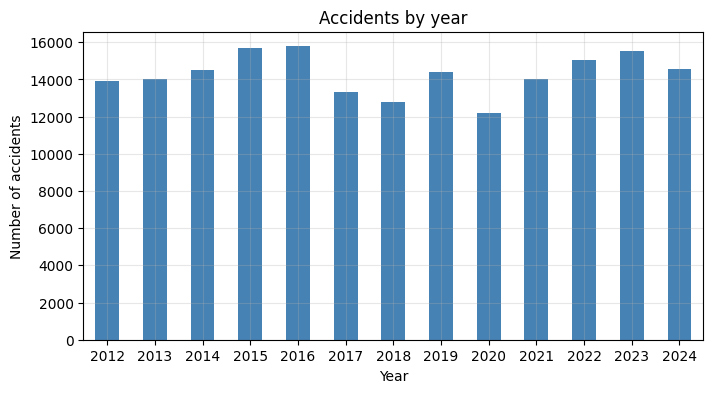

In [ ]:
# Bar chart - number of accidents by year
accidents["YEAR"] = accidents["ACCIDENT_DATE"].dt.year

yearly = (accidents.dropna(subset=["YEAR"])
          .groupby("YEAR")
          .size())

yearly.plot(kind="bar", figsize=(8,4), color="steelblue", title="Accidents by year")
plt.xlabel("Year")
plt.ylabel("Number of accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()


The chart shows the number of road accidents by year. A clear drop can be observed during the pandemic years (2020–2021) when travel restrictions and lockdowns significantly reduced traffic on the roads. After that period the number of accidents began to rise again.

**Accidents by month in 2020**

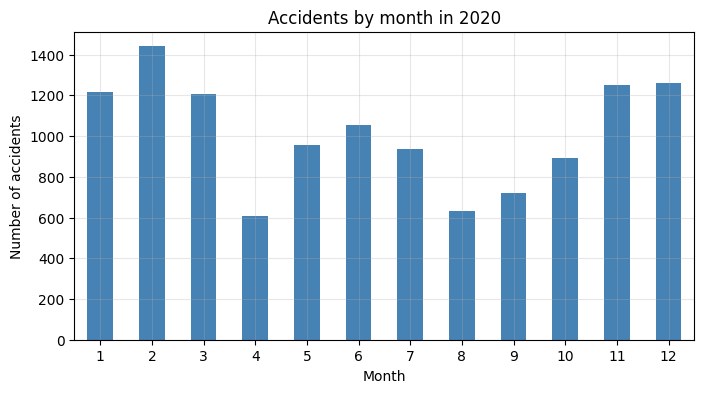

In [ ]:
# Bar chart - number of accidents by month in 2020
accidents["YEAR"] = accidents["ACCIDENT_DATE"].dt.year
accidents["MONTH"] = accidents["ACCIDENT_DATE"].dt.month

acc_2020 = accidents[accidents["YEAR"] == 2020]

monthly_2020 = (acc_2020.dropna(subset=["MONTH"])
                .groupby("MONTH")
                .size()
                .reindex(range(1,13), fill_value=0))

monthly_2020.plot(kind="bar", figsize=(8,4), color="steelblue", title="Accidents by month in 2020")
plt.xlabel("Month")
plt.ylabel("Number of accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()


**Monthly accidents: 2019-2021**

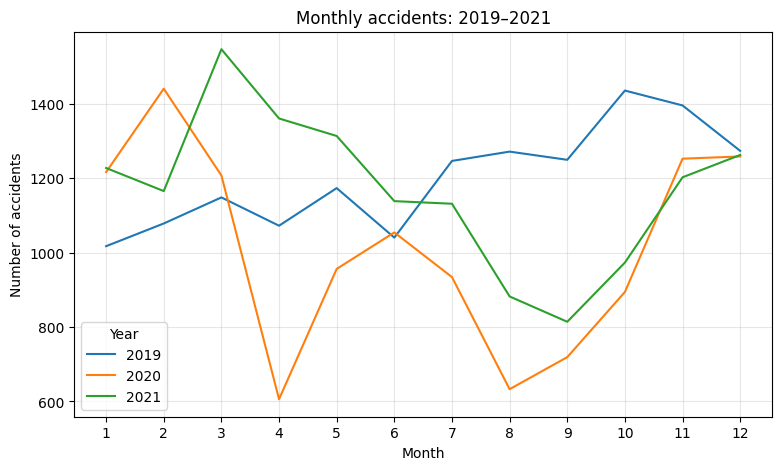

In [ ]:
# Monthly accidents comparison: 2019, 2020, 2021
accidents["YEAR"] = accidents["ACCIDENT_DATE"].dt.year
accidents["MONTH"] = accidents["ACCIDENT_DATE"].dt.month

subset = accidents[accidents["YEAR"].isin([2019, 2020, 2021])]

monthly_counts = (subset.dropna(subset=["MONTH"])
                  .groupby(["MONTH", "YEAR"])
                  .size()
                  .unstack("YEAR")
                  .reindex(range(1, 13), fill_value=0))

monthly_counts.plot(figsize=(9,5), title="Monthly accidents: 2019–2021")
plt.xlabel("Month")
plt.ylabel("Number of accidents")
plt.xticks(range(1,13))
plt.grid(alpha=0.3)
plt.legend(title="Year")
plt.show()


The chart shows monthly accident numbers for 2019, 2020 and 2021 in Victoria. The data clearly aligns with the lockdown periods. The lowest accident counts in 2020 occur in April through October, which corresponds to the two major lockdowns in Victoria (March–May and July–October). During these months, strict travel restrictions and stay at home orders significantly reduced road traffic, leading to fewer reported accidents. Accident numbers begin to rise again after October 2020 as restrictions were lifted.

**Fatal accidents by year**

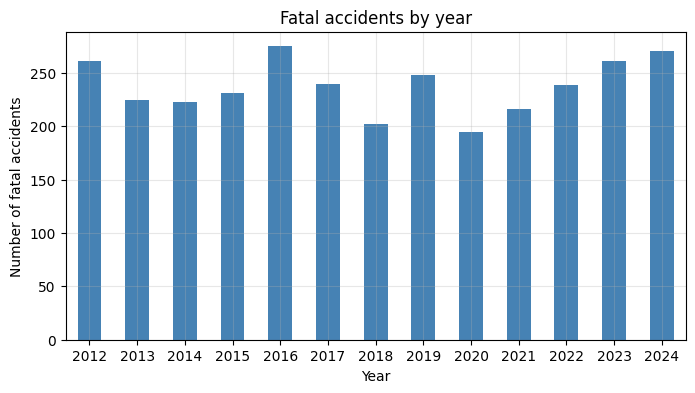

In [ ]:
# Fatal accidents by year
accidents["YEAR"] = accidents["ACCIDENT_DATE"].dt.year

accidents["IS_FATAL"] = accidents["SEVERITY"].astype(str).str.contains("Fatal", case=False, na=False)

fatal_by_year = (accidents[accidents["IS_FATAL"]]
                 .groupby("YEAR")
                 .size())

fatal_by_year.plot(kind="bar", figsize=(8,4), color="steelblue", title="Fatal accidents by year")
plt.xlabel("Year")
plt.ylabel("Number of fatal accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()

The chart shows the number of fatal road accidents by year. We can see noticeably fewer fatal accidents in 2020 and 2021 most likely due to reduced travel during the COVID-19 lockdowns. After restrictions eased number of fatal accidents began to increase slightly again.

**Fatal accidents by month: 2020 vs 2024**

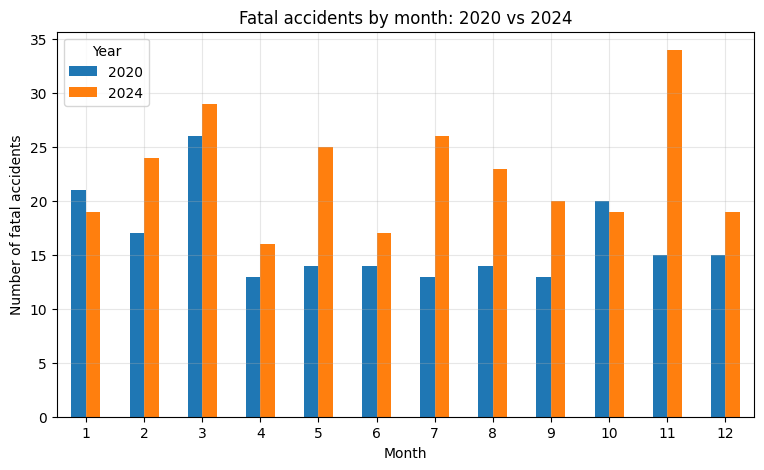

In [ ]:
# Fatal accidents by month: 2020 vs 2024
accidents["YEAR"] = accidents["ACCIDENT_DATE"].dt.year
accidents["MONTH"] = accidents["ACCIDENT_DATE"].dt.month
accidents["IS_FATAL"] = accidents["SEVERITY"].astype(str).str.contains("Fatal", case=False, na=False)

subset = accidents[accidents["YEAR"].isin([2020, 2024])]

fatal_by_month = (subset[subset["IS_FATAL"]]
                  .groupby(["MONTH", "YEAR"])
                  .size()
                  .unstack("YEAR")
                  .reindex(range(1,13), fill_value=0))

fatal_by_month.plot(kind="bar", figsize=(9,5), title="Fatal accidents by month: 2020 vs 2024")
plt.xlabel("Month")
plt.ylabel("Number of fatal accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.legend(title="Year")
plt.show()


Chart compares monthly fatal accidents in Victoria during 2020 and 2024. In 2020 accident numbers dropped between April and October due to COVID-19 lockdowns and limited travel. In contrast, 2024 shows consistently higher levels across most months, reflecting return of normal traffic conditions and mobility after the pandemic years.

**Accidents by hour: weekend vs weekday**

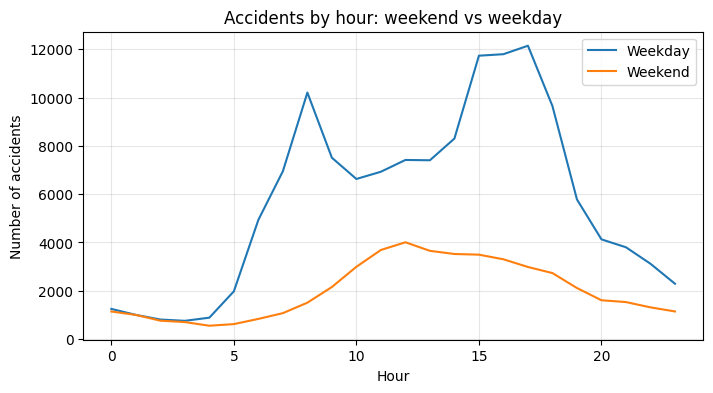

In [ ]:
# Accidents by hour: weekend vs weekday
accidents["is_weekend"] = accidents["ACCIDENT_DOW_NAME"].isin(["Sat", "Sun"])

hourly = (accidents.groupby(["is_weekend", "ACCIDENT_HOUR"])
          .size()
          .unstack(0)
          .fillna(0)
          .reindex(range(24), fill_value=0))

hourly.plot(kind="line", figsize=(8,4), title="Accidents by hour: weekend vs weekday")
plt.xlabel("Hour")
plt.ylabel("Number of accidents")
plt.legend(["Weekday", "Weekend"])
plt.grid(alpha=0.3)
plt.show()


The chart compares the number of road accidents by hour for weekdays and weekends. Weekday accidents peak around morning and afternoon commuting hours, while weekend accidents are more evenly distribute.

**Sex factor**

Cleaning data for sex factor

In [ ]:
person_acc = accidents.merge(person, on="ACCIDENT_NO", how="left")

print("Unique values in SEX column:")
print(person_acc["SEX"].value_counts(dropna=False))

# missing percentage
missing = person_acc["SEX"].isna().sum()
total = len(person_acc)
print("\nTotal records:", total)
print("Missing SEX values:", missing)
print(f"Missing percentage: {missing / total * 100:.2f}%")

Unique values in SEX column:
SEX
M      243959
F      174359
U       15468
NaN        35
Name: count, dtype: int64

Total records: 433821
Missing SEX values: 35
Missing percentage: 0.01%


In [ ]:
# Clean SEX column
person_acc = accidents.merge(person, on="ACCIDENT_NO", how="left")
person_acc["SEX"] = person_acc["SEX"].astype(str).str.strip().str.upper()
person_acc = person_acc[person_acc["SEX"].isin(["F", "M"])].copy()

print("Number of records after filtering:", len(person_acc))
print("\nSex distribution:")
print(person_acc["SEX"].value_counts(normalize=True).mul(100).round(2))


Number of records after filtering: 418318

Sex distribution:
SEX
M    58.32
F    41.68
Name: proportion, dtype: float64


**All Accidents by sex**

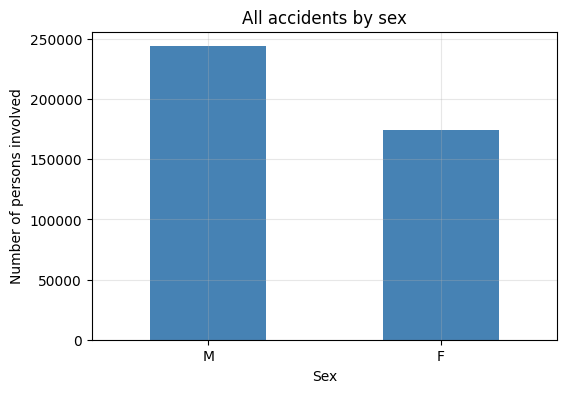

In [ ]:
# Bar chart - accidents by sex
(person_acc["SEX"]
 .value_counts()
 .plot(kind="bar", figsize=(6,4), color="steelblue", title="All accidents by sex"))

plt.xlabel("Sex")
plt.ylabel("Number of persons involved")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.show()


The chart shows the number of people involved in road accidents by sex

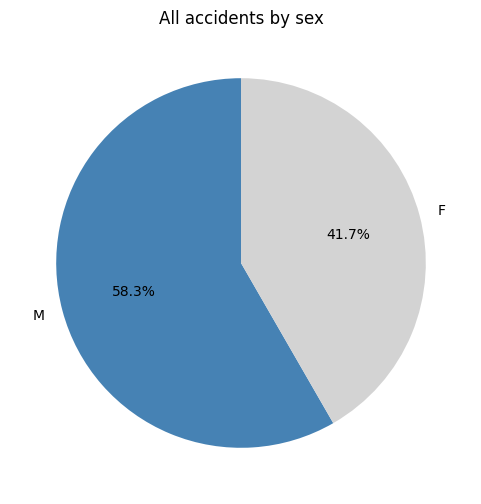

In [ ]:
# Pie chart - accidents by sex
person_acc["SEX"].value_counts().plot(
    kind="pie",
    figsize=(6,6),
    autopct="%.1f%%",
    startangle=90,
    colors=["steelblue", "lightgray"],
    title="All accidents by sex"
)

plt.ylabel("")
plt.show()


The pie chart shows the percentage of people involved in road accidents by sex. Males make up for the majority of those involved, while females represent a smaller share.

**Fatal accidents by sex**

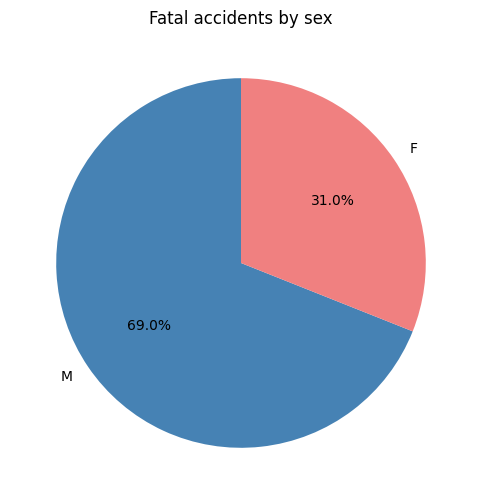

In [ ]:
# Fatal accidents by sex
person_acc["SEVERITY_N"] = person_acc["SEVERITY"].astype(str).str.strip().str.lower()
person_acc["SEX_N"] = person_acc["SEX"].astype(str).str.strip().str.title()

fatal = person_acc[person_acc["SEVERITY_N"].str.contains("fatal", na=False)]
fatal_sex = fatal["SEX_N"].value_counts()

fatal_sex.plot(
    kind="pie",
    figsize=(6,6),
    autopct="%.1f%%",
    startangle=90,
    colors=["steelblue", "lightcoral"],
    title="Fatal accidents by sex"
)

plt.ylabel("")
plt.show()


The pie chart shows distribution of fatal road accidents by sex. Males account for the majority of fatalities, which reflects their overall higher involvement in traffic accidents and potentially riskier driving behaviors compared to females.

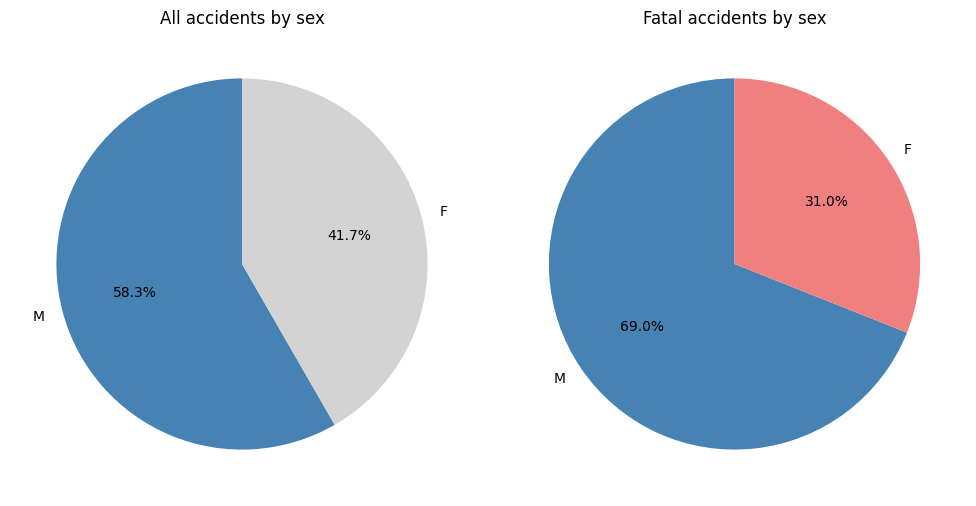

In [ ]:
person_acc["SEVERITY_N"] = person_acc["SEVERITY"].astype(str).str.strip().str.lower()
person_acc["SEX_N"] = person_acc["SEX"].astype(str).str.strip().str.title()

fatal = person_acc[person_acc["SEVERITY_N"].str.contains("fatal", na=False)]
fatal_sex = fatal["SEX_N"].value_counts()
all_sex = person_acc["SEX_N"].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(10,5))

all_sex.plot(
    kind="pie",
    autopct="%.1f%%",
    startangle=90,
    colors=["steelblue", "lightgray"],
    ax=axes[0],
    title="All accidents by sex"
)
axes[0].set_ylabel("")

fatal_sex.plot(
    kind="pie",
    autopct="%.1f%%",
    startangle=90,
    colors=["steelblue", "lightcoral"],
    ax=axes[1],
    title="Fatal accidents by sex"
)
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()


In [ ]:
df = accidents.copy()

if "ACCIDENT_HOUR" not in df.columns:
    df["ACCIDENT_HOUR"] = df["ACCIDENT_TIME"].apply(extract_hour)

df["ACCIDENT_HOUR"] = pd.to_numeric(df["ACCIDENT_HOUR"], errors="coerce").clip(0,23)

# Fatal or serious accidents
sev = df["SEVERITY"].astype(str).str.strip().str.lower()
severe_mask = sev.str.contains("fatal", na=False) | sev.str.contains("serious", na=False)

# Total and severe counts by hour
total_by_hour = (df.dropna(subset=["ACCIDENT_HOUR"])
                   .groupby("ACCIDENT_HOUR")
                   .size()
                   .reindex(range(24), fill_value=0))

severe_by_hour = (df.loc[severe_mask]
                    .dropna(subset=["ACCIDENT_HOUR"])
                    .groupby("ACCIDENT_HOUR")
                    .size()
                    .reindex(range(24), fill_value=0))

share_pct = (severe_by_hour / total_by_hour.replace(0, np.nan) * 100).fillna(0)


**Share of fatal and serious accidents by hour**

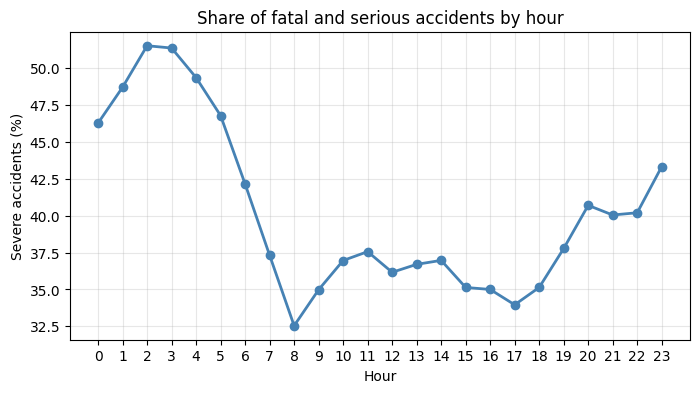

In [ ]:
# Line chart - share of fatal and serious accidents by hour
plt.figure(figsize=(8,4))
plt.plot(share_pct.index, share_pct.values, marker="o", color="steelblue", linewidth=2)
plt.title("Share of fatal and serious accidents by hour")
plt.xlabel("Hour")
plt.ylabel("Severe accidents (%)")
plt.xticks(range(0, 24, 1))
plt.grid(alpha=0.3)
plt.show()


The chart shows the percentage of fatal and serious accidents by hour of the day. The share of severe crashes tends to be higher during night and early morning hours (11 pm - 4 am), which may be related to higher risk behaviors such as speeding or driving under the influence.

**Sex share among all accidents by hour**

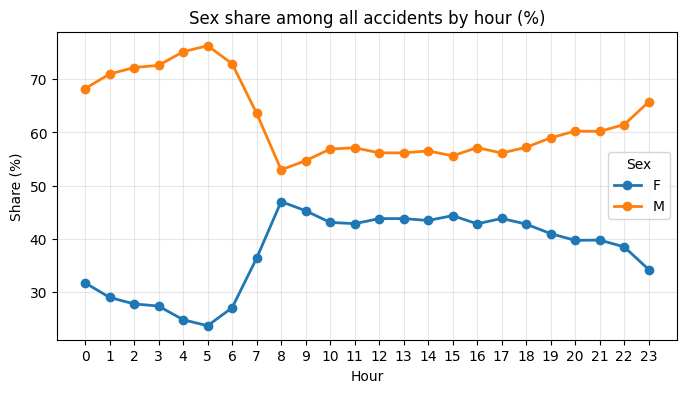

In [ ]:
# Sex share among all accidents by hour
df = person_acc.copy()

# Group by hour and sex
total_by_hour_sex = (df.dropna(subset=["ACCIDENT_HOUR", "SEX"])
                       .groupby(["ACCIDENT_HOUR", "SEX"])
                       .size()
                       .unstack(fill_value=0)
                       .reindex(range(24), fill_value=0))

# share of each sex per hour
share_sex_among_all = (total_by_hour_sex
                       .div(total_by_hour_sex.sum(axis=1).replace(0, np.nan), axis=0)
                       .fillna(0) * 100)

plt.figure(figsize=(8,4))
for col in share_sex_among_all.columns:
    plt.plot(share_sex_among_all.index, share_sex_among_all[col],
             marker="o", linewidth=2, label=col)
plt.title("Sex share among all accidents by hour (%)")
plt.xlabel("Hour")
plt.ylabel("Share (%)")
plt.xticks(range(24))
plt.legend(title="Sex")
plt.grid(alpha=0.3)
plt.show()


The chart shows the percentage share of male and female participants in accidents by hour of the day. For each hour values for males and females add up to 100%, representing their relative proportions among all accidents that occurred during that hour. Males consistently make up for the majority of accident participants, with their share increasing during late night and early morning hours. Female involvement peaks happens during typical commuting times  such as the morning and afternoon rush hours, suggesting greater travel activity related to work, school and daily errands.

**Accidents and severe accidents by sex**

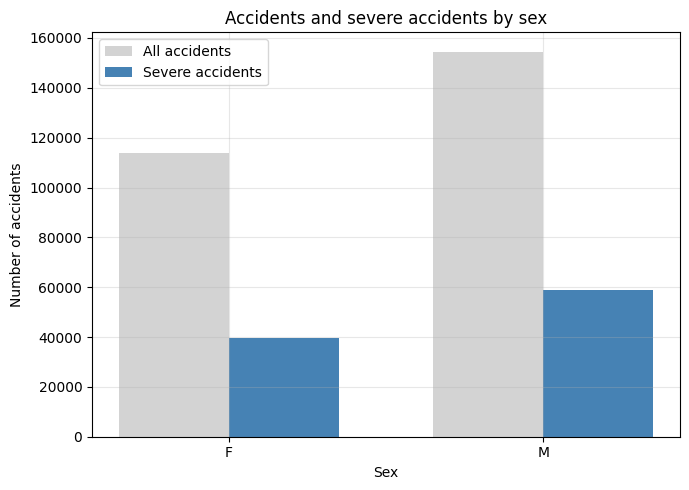

In [ ]:
df = person_acc.copy()

# clean columns
df["SEVERITY_N"] = df["SEVERITY"].astype(str).str.strip().str.lower()
df["SEX_N"] = (
    df["SEX"].astype(str).str.strip().str.title()
    .replace({"Nan": np.nan, "Na": np.nan, "": np.nan, "U": np.nan, "N/A": np.nan, "Unknown": np.nan})
)

# total and severe accidents by sex
total_by_sex = df.groupby("SEX_N")["ACCIDENT_NO"].nunique()
severe_by_sex = (
    df.loc[df["SEVERITY_N"].str.contains("fatal", na=False) | df["SEVERITY_N"].str.contains("serious", na=False)]
      .groupby("SEX_N")["ACCIDENT_NO"].nunique()
)

compare = pd.DataFrame({
    "All accidents": total_by_sex,
    "Severe accidents": severe_by_sex
}).fillna(0)

compare["Severe share (%)"] = (compare["Severe accidents"] / compare["All accidents"] * 100).round(1)

x = np.arange(len(compare.index))
width = 0.35

plt.figure(figsize=(7,5))
plt.bar(x - width/2, compare["All accidents"], width, color="lightgray", label="All accidents")
plt.bar(x + width/2, compare["Severe accidents"], width, color="steelblue", label="Severe accidents")
plt.title("Accidents and severe accidents by sex")
plt.xlabel("Sex")
plt.ylabel("Number of accidents")
plt.xticks(x, compare.index)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


The chart compares the total number of accidents and severe accidents (fatal or serious) by sex. Although males are involved in more accidents overall, they also have a higher proportion of severe outcomes. This pattern suggests that male drivers may be more exposed to risky driving conditions or behaviors, while females are less frequently involved in crashes with high severity.

**Heatmap- accidents by day of week and hour**

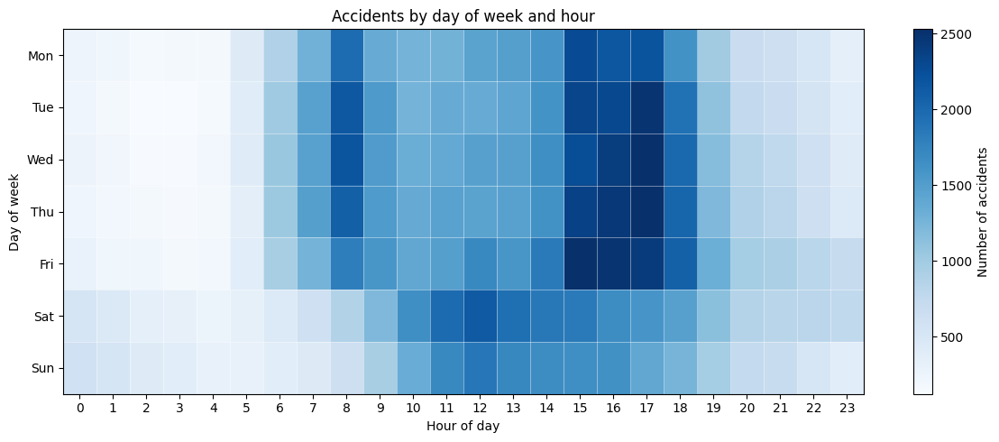

In [ ]:
# Heatmap - accidents by day of week and hour

df = accidents.copy()
df["ACCIDENT_DATE"] = pd.to_datetime(df["ACCIDENT_DATE"], errors="coerce")

df["DOW"] = df.get("ACCIDENT_DOW_NAME", df["ACCIDENT_DATE"].dt.day_name().str[:3])

if "ACCIDENT_HOUR" not in df.columns:
    df["ACCIDENT_HOUR"] = df["ACCIDENT_TIME"].apply(extract_hour)
df["ACCIDENT_HOUR"] = pd.to_numeric(df["ACCIDENT_HOUR"], errors="coerce").clip(0, 23)

#rows = day of week, cols = hour
day_order = ["Mon","Tue","Wed","Thu","Fri","Sat","Sun"]
heat = (df.dropna(subset=["DOW","ACCIDENT_HOUR"])
          .groupby(["DOW","ACCIDENT_HOUR"]).size()
          .unstack(fill_value=0)
          .reindex(day_order)
          .reindex(columns=range(24), fill_value=0))

fig, ax = plt.subplots(figsize=(12,5))
im = ax.imshow(heat.values, cmap="Blues", aspect="auto", interpolation="nearest")

ax.set_xticks(range(24)); ax.set_xticklabels(range(24))
ax.set_yticks(range(len(heat.index))); ax.set_yticklabels(heat.index)

for y in range(heat.shape[0] + 1):
    ax.axhline(y - 0.5, color="white", lw=0.5, alpha=0.6)
for x in range(heat.shape[1] + 1):
    ax.axvline(x - 0.5, color="white", lw=0.5, alpha=0.6)

cbar = plt.colorbar(im, ax=ax); cbar.set_label("Number of accidents")
ax.set_title("Accidents by day of week and hour")
ax.set_xlabel("Hour of day"); ax.set_ylabel("Day of week")
plt.tight_layout(); plt.show()


The heatmap illustrates distribution of road accidents across days of the week and hours of the day. The most intense activity is visible during weekday mornings and afternoons, reflecting traffic when many people commute to work or school. In contrast weekends show a shift toward later hours with more accidents occurring in the evening and nighttime

**Severe (fatal + serious) accidents by day and hour**

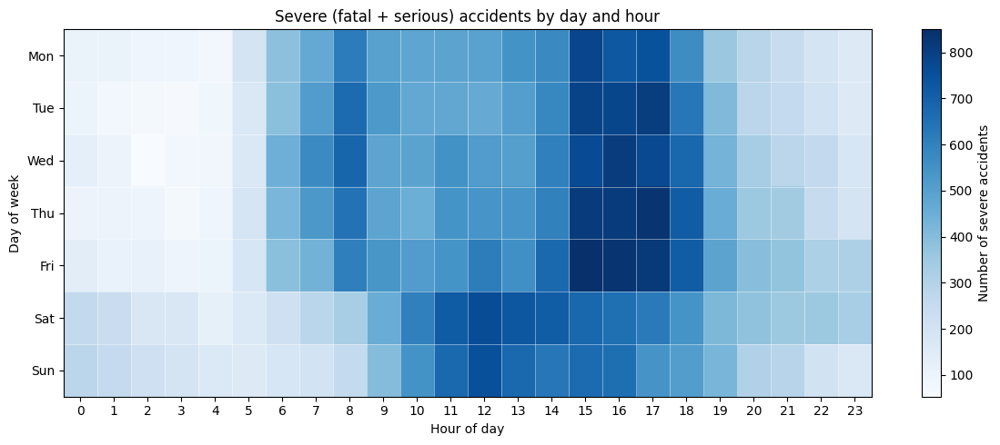

In [ ]:
df = accidents.copy()
df["ACCIDENT_DATE"] = pd.to_datetime(df["ACCIDENT_DATE"], errors="coerce")
df["DOW"] = df.get("ACCIDENT_DOW_NAME", df["ACCIDENT_DATE"].dt.day_name().str[:3])
df["ACCIDENT_HOUR"] = pd.to_numeric(df["ACCIDENT_HOUR"], errors="coerce").clip(0, 23)

sev = df["SEVERITY"].astype(str).str.lower()
mask = sev.str.contains("fatal", na=False) | sev.str.contains("serious", na=False)

day_order = ["Mon","Tue","Wed","Thu","Fri","Sat","Sun"]

heat = (df[mask]
        .dropna(subset=["DOW","ACCIDENT_HOUR"])
        .groupby(["DOW","ACCIDENT_HOUR"])
        .size()
        .unstack(fill_value=0)
        .reindex(day_order)
        .reindex(columns=range(24), fill_value=0))

fig, ax = plt.subplots(figsize=(12,5))
im = ax.imshow(heat.values, cmap="Blues", aspect="auto", interpolation="nearest")

ax.set_xticks(range(24)); ax.set_xticklabels(range(24))
ax.set_yticks(range(len(heat.index))); ax.set_yticklabels(heat.index)

for y in range(heat.shape[0] + 1):
    ax.axhline(y - 0.5, color="white", lw=0.5, alpha=0.6)
for x in range(heat.shape[1] + 1):
    ax.axvline(x - 0.5, color="white", lw=0.5, alpha=0.6)

plt.colorbar(im, ax=ax, label="Number of severe accidents")
ax.set_title("Severe (fatal + serious) accidents by day and hour")
ax.set_xlabel("Hour of day")
ax.set_ylabel("Day of week")
plt.tight_layout()
plt.show()


This heatmap shows when severe accidents (fatal and serious) occur most often.
The highest numbers appear during the day, especially between 3 PM and 6 PM, with Wednesday to Friday being the peak days.


**Age factor**

**Share of severe accidents among drivers by age group (%)**

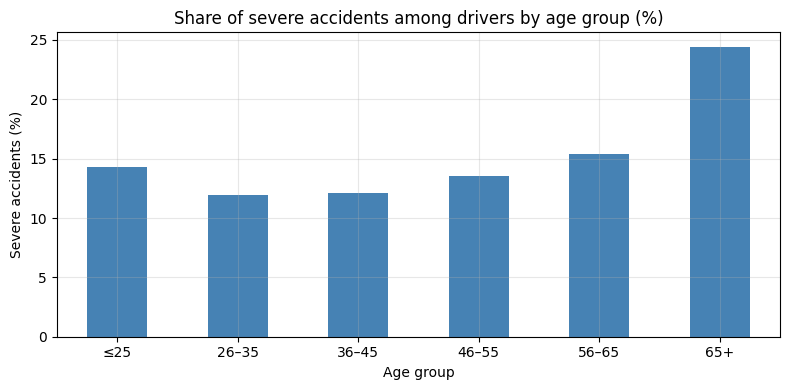

In [ ]:
df = person_acc.copy()

df = df[df["ROAD_USER_TYPE_DESC"].astype(str).str.contains("Driver", case=False, na=False)]
df["AGE_GROUP"] = df["AGE_GROUP"].astype(str).str.extract(r"(\d+)").astype(float)
df["IS_SEVERE"] = df["INJ_LEVEL_DESC"].str.contains("kill|serious", case=False, na=False)

bins = [0, 25, 35, 45, 55, 65, 120]
labels = ["≤25", "26–35", "36–45", "46–55", "56–65", "65+"]
df["AGE_BIN"] = pd.cut(df["AGE_GROUP"], bins=bins, labels=labels, right=False)

age_stats = (df.groupby("AGE_BIN", observed=False)["IS_SEVERE"].mean() * 100).dropna()

plt.figure(figsize=(8,4))
age_stats.plot(kind="bar", color="steelblue")
plt.title("Share of severe accidents among drivers by age group (%)")
plt.xlabel("Age group")
plt.ylabel("Severe accidents (%)")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()




The chart shows the percentage of severe or fatal accidents among drivers by age group. The highest severity rates are seen for older drivers aged 65 and above who are more physically vulnerable in crashes.Younger drivers under 25 also show elevated severity, most likely due to limited experience and risky behavior, while middle-aged drivers generally experience fewer severe outcomes.


**Number of accidents by age group (drivers)**

/tmp/ipython-input-1219123159.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("AGE_BIN")["ACCIDENT_NO"]


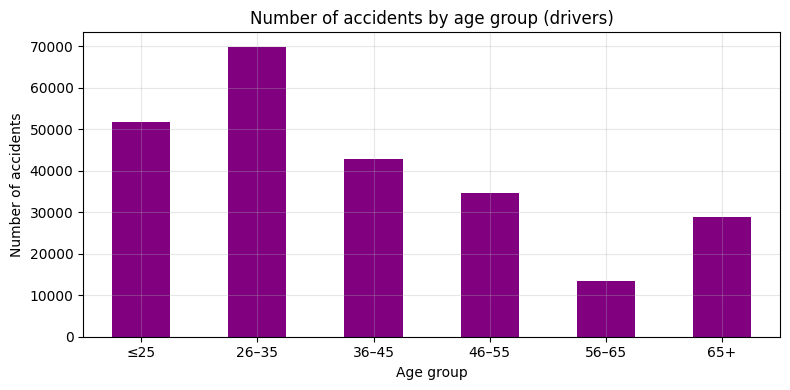

In [ ]:
df = person_acc.copy()

df = df[df["ROAD_USER_TYPE_DESC"].astype(str).str.contains("Driver", case=False, na=False)]
df["AGE_GROUP"] = df["AGE_GROUP"].astype(str).str.extract(r"(\d+)").astype(float)

bins = [0, 25, 35, 45, 55, 65, 120]
labels = ["≤25", "26–35", "36–45", "46–55", "56–65", "65+"]
df["AGE_BIN"] = pd.cut(df["AGE_GROUP"], bins=bins, labels=labels, right=False)

age_counts = (
    df.dropna(subset=["AGE_BIN"])
      .groupby("AGE_BIN")["ACCIDENT_NO"]
      .nunique()
)

plt.figure(figsize=(8,4))
age_counts.plot(kind="bar", color="purple")
plt.title("Number of accidents by age group (drivers)")
plt.xlabel("Age group")
plt.ylabel("Number of accidents")
plt.xticks(rotation=0)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


The chart shows the number of accidents involving drivers by age group. The highest number of crashes is recorded among younger and middle-aged drivers, particularly those aged between 26 and 45.

/tmp/ipython-input-2821636496.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_counts = df.dropna(subset=["AGE_BIN"]).groupby("AGE_BIN")["ACCIDENT_NO"].nunique()


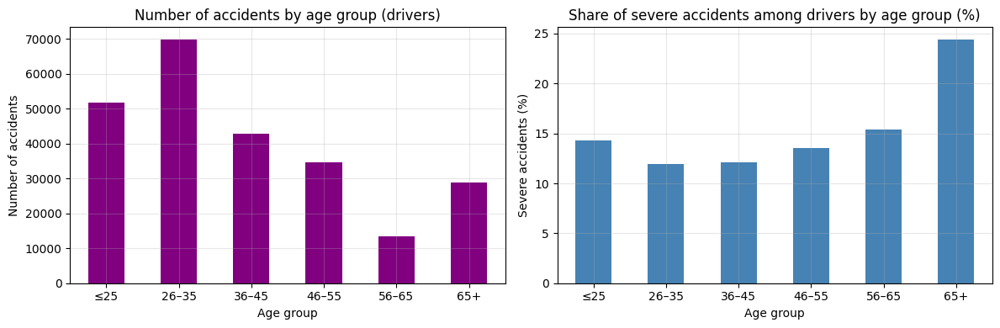

In [ ]:
df = person_acc.copy()
df = df[df["ROAD_USER_TYPE_DESC"].astype(str).str.contains("Driver", case=False, na=False)]
df["AGE_GROUP"] = df["AGE_GROUP"].astype(str).str.extract(r"(\d+)").astype(float)
df["IS_SEVERE"] = df["INJ_LEVEL_DESC"].str.contains("kill|serious", case=False, na=False)
bins = [0, 25, 35, 45, 55, 65, 120]
labels = ["≤25", "26–35", "36–45", "46–55", "56–65", "65+"]
df["AGE_BIN"] = pd.cut(df["AGE_GROUP"], bins=bins, labels=labels, right=False)
age_counts = df.dropna(subset=["AGE_BIN"]).groupby("AGE_BIN")["ACCIDENT_NO"].nunique()
age_stats = (df.groupby("AGE_BIN", observed=False)["IS_SEVERE"].mean() * 100).dropna()

fig, axes = plt.subplots(1, 2, figsize=(12,4))
age_counts.plot(kind="bar", color="purple", ax=axes[0])
axes[0].set_title("Number of accidents by age group (drivers)")
axes[0].set_xlabel("Age group")
axes[0].set_ylabel("Number of accidents")
axes[0].set_xticklabels(age_counts.index, rotation=0)
axes[0].grid(alpha=0.3)

age_stats.plot(kind="bar", color="steelblue", ax=axes[1])
axes[1].set_title("Share of severe accidents among drivers by age group (%)")
axes[1].set_xlabel("Age group")
axes[1].set_ylabel("Severe accidents (%)")
axes[1].set_xticklabels(age_stats.index, rotation=0)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


**Pedestrian accidents by hour - adults vs children**

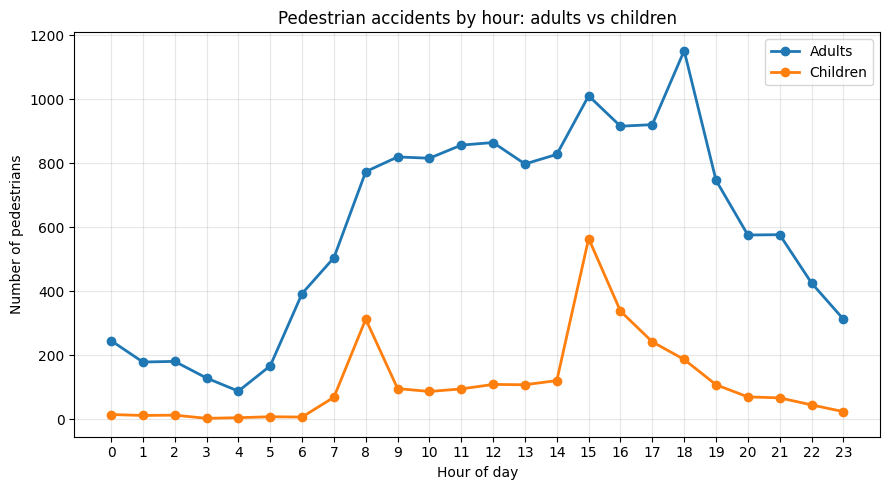

In [ ]:
# Pedestrian accidents by hour - adults vs children

df = person_acc.copy()
ped = df[df["ROAD_USER_TYPE_DESC"].astype(str).str.contains("Pedestrian", case=False, na=False)].copy()

ped["AGE_NUM"] = ped["AGE_GROUP"].astype(str).str.extract(r"(\d+)").astype(float)
ped["IS_CHILD"] = ped["AGE_NUM"] < 18

by_hour = (ped.dropna(subset=["ACCIDENT_HOUR"])
             .groupby(["ACCIDENT_HOUR", "IS_CHILD"])
             .size()
             .unstack(fill_value=0)
             .reindex(range(24), fill_value=0))

adults = by_hour.get(False, pd.Series(0, index=range(24)))
children = by_hour.get(True, pd.Series(0, index=range(24)))

plt.figure(figsize=(9,5))
plt.plot(adults.index, adults.values, marker="o", linewidth=2, label="Adults")
plt.plot(children.index, children.values, marker="o", linewidth=2, label="Children")
plt.title("Pedestrian accidents by hour: adults vs children")
plt.xlabel("Hour of day")
plt.ylabel("Number of pedestrians")
plt.xticks(range(24))
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()




The chart compares pedestrian accidents by hour for adults and children. Each point shows how many pedestrians in a given group were involved in accidents at that hour. Adult counts dominate overall, while children’s involvement tends to concentrate around daytime and typical school/after-school hours.


**Heatmap - severe accidents (%) by age group and speed zone (drivers only)**

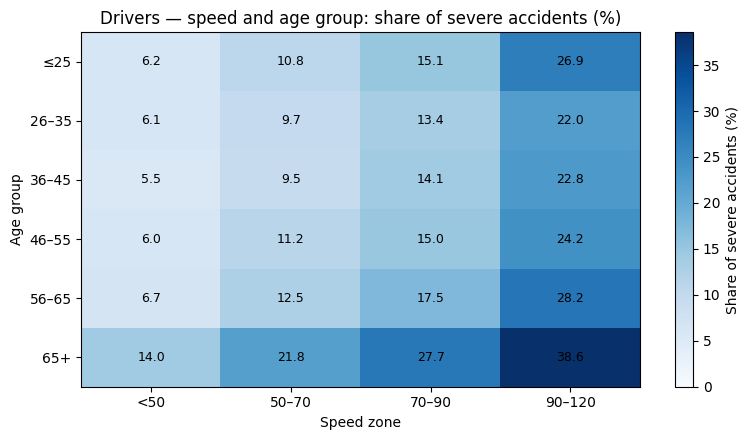

In [ ]:
# Heatmap - severe accidents (%) by age group and speed zone (drivers only)

df = person_acc.copy()

df = df[df["ROAD_USER_TYPE_DESC"].astype(str).str.contains("Driver", case=False, na=False)]
df["IS_SEVERE"] = df["INJ_LEVEL_DESC"].astype(str).str.contains("kill|serious", case=False, na=False)

df["AGE_NUM"] = df["AGE_GROUP"].astype(str).str.extract(r"(\d+)").astype(float)
age_bins = [0, 25, 35, 45, 55, 65, 120]
age_labels = ["≤25", "26–35", "36–45", "46–55", "56–65", "65+"]
df["AGE_BIN"] = pd.cut(df["AGE_NUM"], bins=age_bins, labels=age_labels, right=False)

df["SPEED_ZONE_NUM"] = df["SPEED_ZONE"].astype(str).str.extract(r"(\d+)").astype(float)
speed_bins = [0, 50, 70, 90, 120, 300]
speed_labels = ["<50", "50–70", "70–90", "90–120", "120+"]
df["SPEED_BIN"] = pd.cut(df["SPEED_ZONE_NUM"], bins=speed_bins, labels=speed_labels, right=False)

heat = (df.dropna(subset=["AGE_BIN", "SPEED_BIN"])
          .pivot_table(index="AGE_BIN", columns="SPEED_BIN",
                       values="IS_SEVERE", aggfunc="mean", observed=False) * 100)

fig, ax = plt.subplots(figsize=(8,4.5))
im = ax.imshow(heat.values, cmap="Blues", aspect="auto",
               vmin=0, vmax=np.nanmax(heat.values))

ax.set_xticks(range(len(heat.columns))); ax.set_xticklabels(heat.columns)
ax.set_yticks(range(len(heat.index)));   ax.set_yticklabels(heat.index)

vals = np.nan_to_num(heat.values, nan=0.0)
for i in range(vals.shape[0]):
    for j in range(vals.shape[1]):
        ax.text(j, i, f"{vals[i,j]:.1f}", ha="center", va="center", fontsize=9, color="black")

plt.colorbar(im, ax=ax, label="Share of severe accidents (%)")
ax.set_title("Drivers — speed and age group: share of severe accidents (%)")
ax.set_xlabel("Speed zone")
ax.set_ylabel("Age group")
plt.tight_layout()
plt.show()




The heatmap shows the percentage of severe or fatal accidents among drivers by age group and speed zone. The results indicate that the likelihood of a severe crash increases with higher speed limits, especially above 90 km/h. Older drivers (65+) and young drivers (≤25) show relatively higher severity shares, highlighting both physical vulnerability in older age and risk-taking behavior among younger drivers.

This percentage represents the share of all accidents within a given driver age group and speed zone that resulted in serious injuries or fatalities.


**Different hours – few accidents, many deaths**

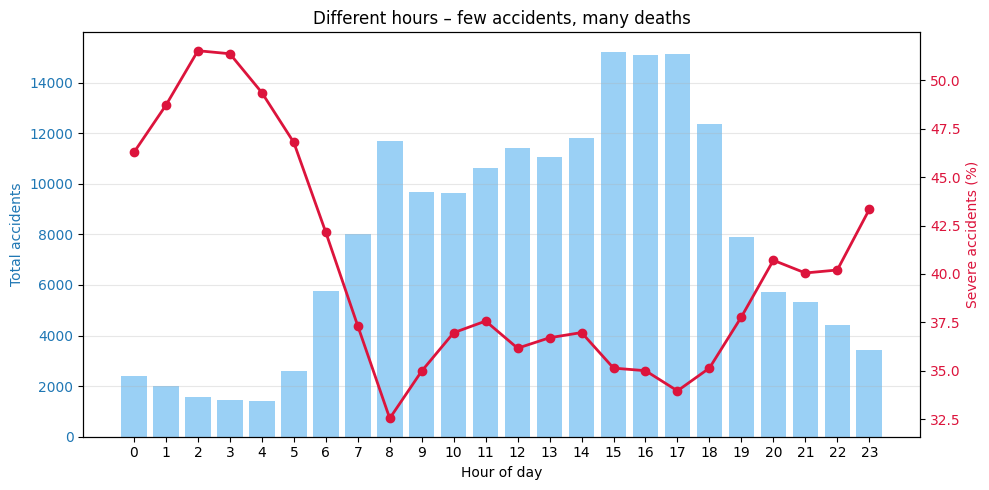

In [ ]:
df = accidents.copy()

df["ACCIDENT_HOUR"] = pd.to_numeric(df.get("ACCIDENT_HOUR"), errors="coerce").clip(0, 23)
sev = df["SEVERITY"].astype(str).str.strip().str.lower()
severe_mask = sev.str.contains("fatal", na=False) | sev.str.contains("serious", na=False)

total_by_hour = (df.dropna(subset=["ACCIDENT_HOUR"])
                   .groupby("ACCIDENT_HOUR")
                   .size()
                   .reindex(range(24), fill_value=0))

severe_by_hour = (df.loc[severe_mask]
                    .dropna(subset=["ACCIDENT_HOUR"])
                    .groupby("ACCIDENT_HOUR")
                    .size()
                    .reindex(range(24), fill_value=0))

share_pct = (severe_by_hour / total_by_hour.replace(0, np.nan) * 100).fillna(0)

x = np.arange(24)
fig, ax1 = plt.subplots(figsize=(10,5))

ax1.bar(x, total_by_hour.values, color="#9ad0f5", label="Total accidents")
ax1.set_xlabel("Hour of day")
ax1.set_ylabel("Total accidents", color="tab:blue")
ax1.tick_params(axis="y", labelcolor="tab:blue")
ax1.set_xticks(x)
ax1.set_xticklabels(x)

ax2 = ax1.twinx()
ax2.plot(x, share_pct.values, color="crimson", marker="o", linewidth=2, label="Severe accidents (%)")
ax2.set_ylabel("Severe accidents (%)", color="crimson")
ax2.tick_params(axis="y", labelcolor="crimson")

plt.title("Different hours – few accidents, many deaths")
ax1.grid(alpha=0.3, axis="y")
fig.tight_layout()
plt.show()




The chart combines the total number of accidents (bars) with the share of severe or fatal ones (red line) by hour of the day. While most crashes occur during daytime hours, the proportion of severe accidents rises sharply at night and early morning, when visibility, fatigue and risk behaviors are more common.

The percentage shows how many of all accidents that occurred at a given hour resulted in serious injuries or fatalities.


## **Effect of Police Attendance**

Police attendance plays a huge role in ensuring safety on the road. One can assume that police attendance could affect the severity of the accidents. Therefore this part aims to investigate whether such claim is true or false.

**Data pre-processing**

In [ ]:
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier

df = pd.read_csv('/content/drive/MyDrive/Mobility Engineering/Data Science and Security for Mobility/Assignment/victorian_road_crash_data.csv', delimiter = ',')
df[df.select_dtypes(include=['number']).columns] = df.select_dtypes(include=['number']).fillna(-1)
df[df.select_dtypes(include=['object']).columns] = df.select_dtypes(include=['object']).fillna('Not known')
df.isna().sum()

,0
ACCIDENT_NO,0
ACCIDENT_DATE,0
ACCIDENT_TIME,0
ACCIDENT_TYPE,0
DAY_OF_WEEK,0
DCA_CODE,0
DCA_CODE_DESCRIPTION,0
LIGHT_CONDITION,0
POLICE_ATTEND,0
ROAD_GEOMETRY,0


**Crosstab of police attendance vs. severity of accidents**

In [ ]:
print(df['POLICE_ATTEND'].unique())
print(df['SEVERITY'].unique())
pd.crosstab(df['SEVERITY'], df['POLICE_ATTEND'])

['Yes' 'No' 'Not known']
['Serious injury accident' 'Other injury accident' 'Fatal accident'
 'Non injury accident']


POLICE_ATTEND,No,Not known,Yes
SEVERITY,,,
Fatal accident,24,2,3107
Non injury accident,1,0,3
Other injury accident,41044,555,76779
Serious injury accident,7578,118,58795


**Police Attendance by Accident Severity**

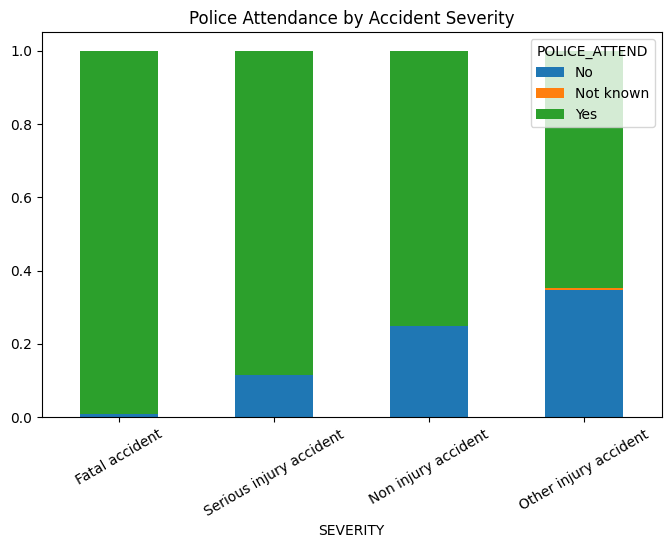

In [ ]:
severity_order = [
    'Fatal accident',
    'Serious injury accident',
    'Non injury accident',
    'Other injury accident'
]

table = pd.crosstab(df['SEVERITY'], df['POLICE_ATTEND'], normalize='index')
table = table.reindex(severity_order)
table.plot(kind='bar', stacked=True, figsize=(8,5))
plt.title('Police Attendance by Accident Severity')
plt.xticks(rotation=30)
plt.show()

From the chart above, we can briefly see that the majority of the accidents, however the severity, are attended by the police, with "other injury accidents" having the largest proportion of non-attendance.

**Variables Importance**

On the other hand, we want to see which of the variables have the most importance in determining police attendance or not. Therefore, with a simple code shown below, we can draw up the importance hierarchy. Shown at the very top is the speed zone.

With that in mind, we would like to investigate further how varying speed zones affect the severity and, to an extent, the police attendance.

In [ ]:
importances = pd.Series(model.feature_importances_, index=x.columns)
importances = importances.sort_values(ascending=False)
print(importances)

SPEED_ZONE                0.409911
SERIOUSINJURY             0.221580
DRIVER                    0.143176
LIGHT_CONDITION           0.142163
RUN_OFFROAD               0.057228
ACCIDENT_TYPE             0.015345
DCA_CODE_DESCRIPTION      0.005340
DCA_CODE                  0.002115
INJ_OR_FATAL              0.000978
SEVERITY                  0.000948
ACCIDENT_TIME             0.000690
RMA                       0.000289
NONINJURED                0.000237
ROAD_TYPE                 0.000000
ROAD_NAME                 0.000000
ROAD_GEOMETRY             0.000000
ACCIDENT_NO               0.000000
ACCIDENT_DATE             0.000000
DAY_OF_WEEK               0.000000
LONGITUDE                 0.000000
LATITUDE                  0.000000
DTP_REGION                0.000000
LGA_NAME                  0.000000
ROAD_ROUTE_1              0.000000
TOTAL_PERSONS             0.000000
FATALITY                  0.000000
VICGRID_Y                 0.000000
OTHERINJURY               0.000000
MALES               

**Accident Count by Speed Zone**

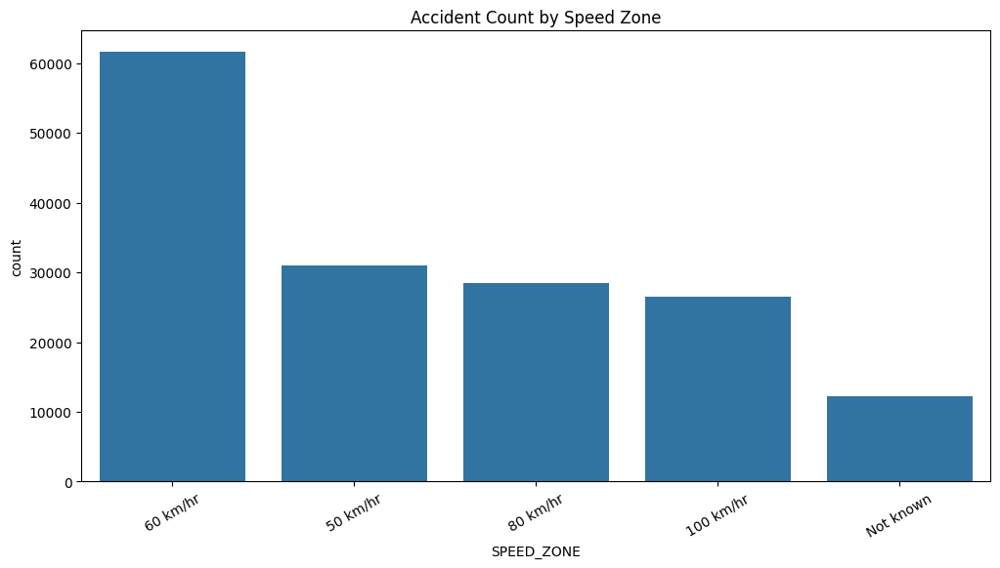

In [ ]:
top = df['SPEED_ZONE'].value_counts().nlargest(5).index

plt.figure(figsize=(12,6))
sns.countplot(x='SPEED_ZONE', data=df[df['SPEED_ZONE'].isin(top)],
              order=top)

plt.xticks(rotation=30)
plt.title("Accident Count by Speed Zone")
plt.show()

From the chart above, we can see that the highest number of accidents occur in the 60 km/hr speed zone.

**Proportions of Police Attendance by Accidents Occuring in Different Speed Zones**

In [ ]:
df['SPEED_ZONE'] = df['SPEED_ZONE'].replace('Camping grounds or off road', 'Off road')
df['SPEED_ZONE'].unique(), df['POLICE_ATTEND'].unique()
cross_tab = pd.crosstab(df['SPEED_ZONE'], df['POLICE_ATTEND'])
cross_tab['TOTAL'] = cross_tab.sum(axis=1)
cross_tab.loc['Grand Total'] = cross_tab.sum()
cross_tab.style.format("{:,}")

POLICE_ATTEND,No,Not known,Yes,TOTAL
SPEED_ZONE,,,,
100 km/hr,"4,444",55,"22,036","26,535"
110 km/hr,167,3,"1,766","1,936"
30km/hr,156,0,205,361
40 km/hr,"3,933",44,"8,017","11,994"
50 km/hr,"7,681",76,"23,242","30,999"
60 km/hr,"14,296",185,"47,074","61,555"
70 km/hr,"2,307",34,"9,552","11,893"
75 km/hr,6,1,13,20
80 km/hr,"5,494",82,"22,823","28,399"


In [ ]:
proportions = pd.crosstab(df['SPEED_ZONE'], df['POLICE_ATTEND'], normalize='index') * 100
proportions.round(2)

POLICE_ATTEND,No,Not known,Yes
SPEED_ZONE,,,
100 km/hr,16.75,0.21,83.05
110 km/hr,8.63,0.15,91.22
30km/hr,43.21,0.00,56.79
40 km/hr,32.79,0.37,66.84
50 km/hr,24.78,0.25,74.98
60 km/hr,23.22,0.30,76.47
70 km/hr,19.40,0.29,80.32
75 km/hr,30.00,5.00,65.00
80 km/hr,19.35,0.29,80.37


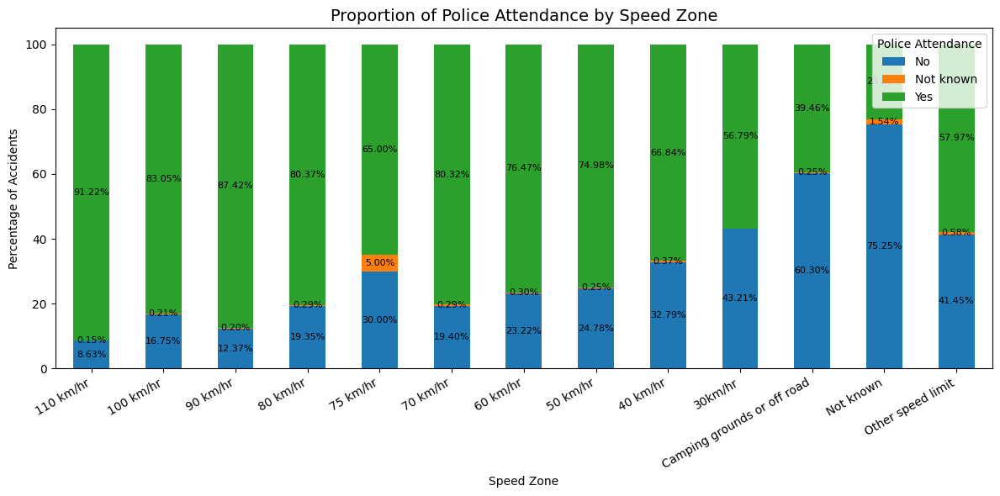

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

proportions = pd.crosstab(
    df['SPEED_ZONE'],
    df['POLICE_ATTEND'],
    normalize='index'
) * 100

proportions = proportions.reset_index()

proportions['speed_num'] = proportions['SPEED_ZONE'].str.extract(r'(\d+)').astype(float)

proportions = proportions.sort_values('speed_num', ascending=False)

proportions = proportions.drop(columns='speed_num')

proportions = proportions.set_index('SPEED_ZONE')

fig, ax = plt.subplots(figsize=(12, 6))

proportions.plot(
    kind='bar',
    stacked=True,
    ax=ax
)

plt.title("Proportion of Police Attendance by Speed Zone", fontsize=14)
plt.xlabel("Speed Zone")
plt.ylabel("Percentage of Accidents")
plt.xticks(rotation=30, ha='right')
plt.legend(title="Police Attendance", loc='upper right')

for container in ax.containers:
    for bar in container:
        height = bar.get_height()
        if height == 0:
            continue

        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_y() + height / 2
        ax.text(
            x, y,
            f"{height:.2f}%",
            ha='center', va='center',
            fontsize=8, color='black'
        )

plt.tight_layout()
plt.show()

In [ ]:
df_60 = df[df['SPEED_ZONE'] == '60 km/hr']

df_60['DEG_URBAN_NAME'].value_counts()

,count
DEG_URBAN_NAME,
MELB_URBAN,45647
LARGE_PROVINCIAL_CITIES,5395
SMALL_CITIES,4231
RURAL_VICTORIA,3107
TOWNS,2265
SMALL_TOWNS,581
Not known,249
MELBOURNE_CBD,80


Zooming into the result for 60 km/hr speedzone, it is shown that the urban degree at which the accidents happen the most are Melbourne Urban.

With this in mind, we would like to investigate how urban degree of the accident area has a correlation with the number of accidents and also the police attendance.

The assumption here is police will tend to attend the site of accident if it's near where the police infrastructures are located.

**Effect of Urban Degree on Police Attendance**

In [ ]:
# Crosstab of POLICE_ATTEND and DEG_URBAN_NAME
df_subset = df[['POLICE_ATTEND', 'DEG_URBAN_NAME']] # POLICE_ATTEND: Yes, No, Not Known
(df_subset.isna().sum() / len(df))*100
df = df.dropna(subset=['DEG_URBAN_NAME', 'POLICE_ATTEND', 'SEVERITY']) # cut rows with unknown collumn
df_subset

ct = pd.crosstab(df_subset['DEG_URBAN_NAME'], df_subset['POLICE_ATTEND'])
ct

POLICE_ATTEND,No,Not known,Yes
DEG_URBAN_NAME,,,
LARGE_PROVINCIAL_CITIES,2657,31,8090
MELBOURNE_CBD,821,19,1449
MELB_URBAN,32141,496,84859
Not known,274,3,711
RURAL_VICTORIA,9330,79,29818
SMALL_CITIES,1937,27,7719
SMALL_TOWNS,387,3,1324
TOWNS,1100,17,4714


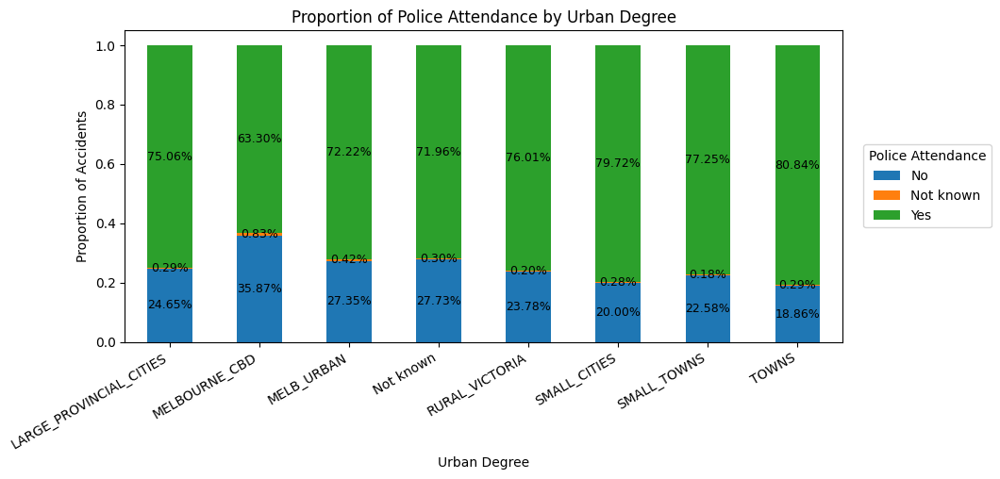

In [ ]:
ct_normalized = ct.div(ct.sum(axis=1), axis=0)
fig, ax = plt.subplots(figsize=(10,6))
ct_normalized.plot(kind='bar', stacked=True, ax=ax,
                   )
plt.title('Proportion of Police Attendance by Urban Degree')
plt.xlabel('Urban Degree')
plt.ylabel('Proportion of Accidents')
plt.legend(title='Police Attend')

for container in ax.containers:
    ax.bar_label(
        container,
        labels=[f'{v.get_height()*100:.2f}%' if v.get_height() > 0 else '' for v in container],
        label_type='center',
        fontsize=9,
        color='black'
    )

plt.legend(
    title="Police Attendance",
    loc='center left',
    bbox_to_anchor=(1.02, 0.5)   # push legend to the right
)


plt.tight_layout()
plt.xticks(rotation=30, ha='right')  # tilt x-axis labels 30°, align right
plt.show()

In this visualization, at first glance, it looks like it shares the same trend: majority of the accidents in each urban area are attended by the police. However, upon closer look, we can see that Melbourne CBD has the smallest share of accidents attended by the police at 67.6%. This is worth investigating, since intuitively a CBD (Central Business District) areas are usually located in the center of the city with fairly easy access to police infrastructures.

With that in mind, let's dive deeper into Melbourne CBD area.

**Police attendance against severity of accidents in Melbourne CBD area**

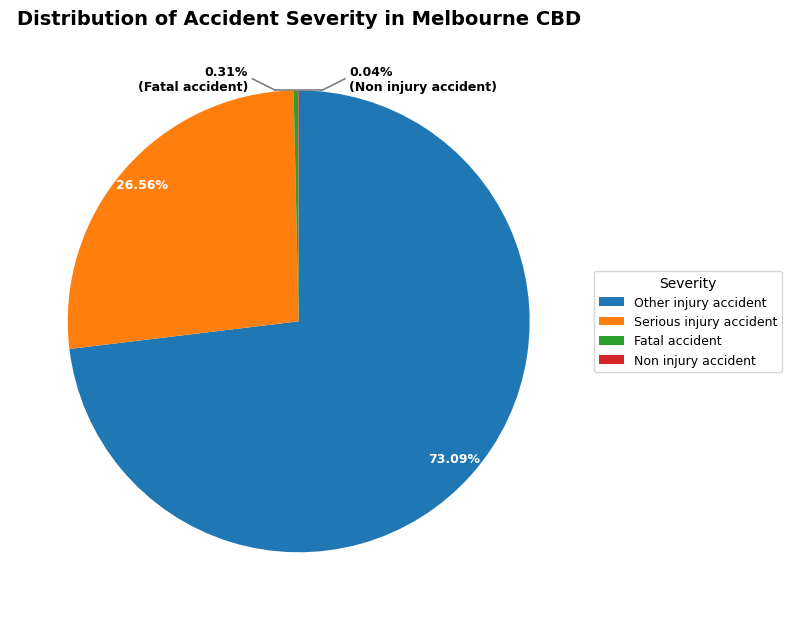

In [ ]:
severity_counts = df_cbd['SEVERITY'].value_counts().sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(8, 8))
wedges, _ = ax.pie(
    severity_counts,
    labels=None,
    autopct=None,
    startangle=90,
    counterclock=False,
)

total = severity_counts.sum()

for wedge, (severity, count) in zip(wedges, severity_counts.items()):
    pct = 100 * count / total
    angle = (wedge.theta2 + wedge.theta1) / 2.0
    x = np.cos(np.deg2rad(angle))
    y = np.sin(np.deg2rad(angle))

    label = f"{pct:.2f}%"

    if severity == "Non injury accident":
        line_x = 0.1
        line_y = y
        label_x = line_x + 0.1
        label_y = line_y + 0.05

        ax.plot([x, line_x], [y, line_y], color='gray', lw=1.2)
        ax.plot([line_x, label_x], [line_y, label_y], color='gray', lw=1.2)

        ax.text(
            label_x + 0.02,
            label_y,
            f"{label}\n({severity})",
            ha='left',
            va='center',
            fontsize=9,
            fontweight='bold'
        )

    elif severity == "Fatal accident":
        line_x = -0.1
        line_y = y
        label_x = line_x - 0.1
        label_y = line_y + 0.05

        ax.plot([x, line_x], [y, line_y], color='gray', lw=1.2)
        ax.plot([line_x, label_x], [line_y, label_y], color='gray', lw=1.2)

        ax.text(
            label_x - 0.02,
            label_y,
            f"{label}\n({severity})",
            ha='right',
            va='center',
            fontsize=9,
            fontweight='bold'
        )

    else:
        ax.text(
            0.9 * x,
            0.9 * y,
            label,
            ha='center',
            va='center',
            fontsize=9,
            fontweight='bold',
            color='white'
        )

ax.legend(
    wedges,
    severity_counts.index,
    title="Severity",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1),
    fontsize=9
)

ax.set_title("Distribution of Accident Severity in Melbourne CBD", fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

In [ ]:
df['DEG_URBAN_NAME'] = df['DEG_URBAN_NAME'].astype(str).str.strip().str.upper()
df['POLICE_ATTEND'] = df['POLICE_ATTEND'].astype(str).str.strip().str.lower()
df['SEVERITY'] = df['SEVERITY'].astype(str).str.strip()

mask_cbd = df['DEG_URBAN_NAME'] == 'MELBOURNE_CBD'
df_cbd = df.loc[mask_cbd]

severity_police_crosstab = pd.crosstab(
    df_cbd['SEVERITY'],
    df_cbd['POLICE_ATTEND'],
    margins=True
)
severity_police_crosstab

POLICE_ATTEND,no,not known,yes,All
SEVERITY,,,,
Fatal accident,0,0,7,7
Non injury accident,0,0,1,1
Other injury accident,712,15,946,1673
Serious injury accident,109,4,495,608
All,821,19,1449,2289


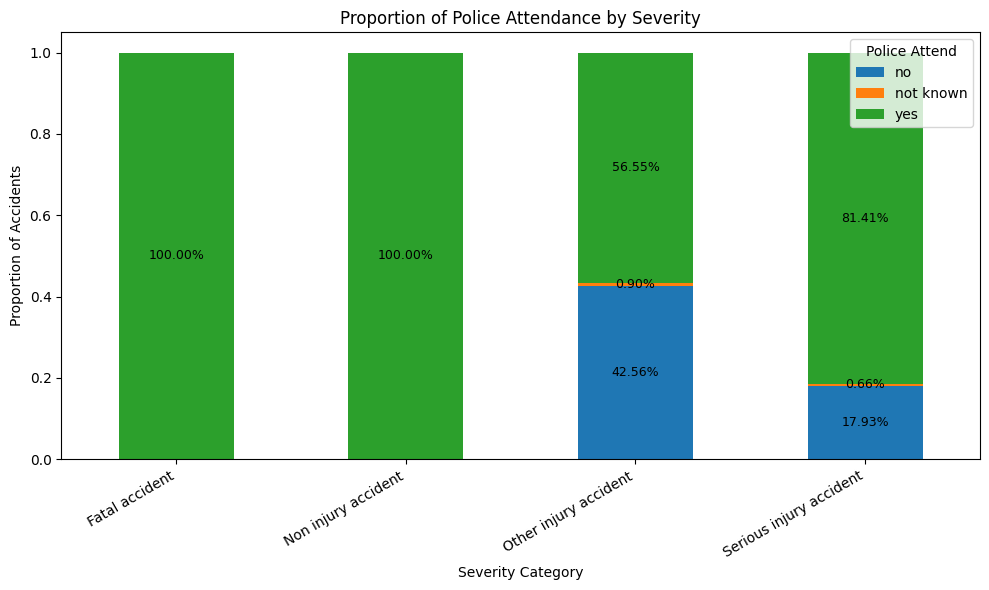

In [ ]:
# Remove 'All' row/column before normalization
ct = severity_police_crosstab.drop(index='All', errors='ignore')
ct = ct.drop(columns='All', errors='ignore')

# Normalize by row (so each severity sums to 1.0)
severity_police_crosstab_normalized = ct.div(ct.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(10, 6))
severity_police_crosstab_normalized.plot(
    kind='bar',
    stacked=True,
    ax=ax,
)

plt.title('Proportion of Police Attendance by Severity')
plt.xlabel('Severity Category')
plt.ylabel('Proportion of Accidents')
plt.legend(title='Police Attend')
plt.xticks(rotation=30, ha='right')

# Add correct percentage labels
for container in ax.containers:
    labels = [
        f'{v.get_height()*100:.2f}%' if v.get_height() > 0 else ''
        for v in container
    ]
    ax.bar_label(
        container,
        labels=labels,
        label_type='center',
        fontsize=9,
        color='black'
    )

plt.tight_layout()
plt.show()

Here we can see that both fatal accidents and non-injury accidents are attended by the police 100% of the times, whereas there are proportions of accidents for serious and other types of injuries that were not attended.

This shows that fatal crashes always trigger a police response, which is expected and perhaps mandatory. But attendance is lower for other types of injury. This might be due to the fact that the less severe accidents may be considered as "petty" accidents which require little to no police attendance (intuitively, accidents which are more fatal have higher priority to be attended to)

On another note, Melbourne CBD has the lowest police attendance share because it has a disproportionately high number of “Other injury accidents,” which also happen to have the lowest police attendance rate.

In conclusion, police attendance strongly correlates with severity, but not perfectly.

**Investigating Accident Severity in Melbourne Urban Area**

Recalling the distribution of accidents based on urban area, we know that the Melbourne Urban area shares the highest number of accident count compared to other area. Therefore, it is worth investigating. Let's take a look.

In [ ]:
mask_urban = df['DEG_URBAN_NAME'] == 'MELB_URBAN'
df_urban = df.loc[mask_urban]

urban_severity_police_crosstab = pd.crosstab(
    df_urban['SEVERITY'],
    df_urban['POLICE_ATTEND'],
    margins=True
)
urban_severity_police_crosstab

POLICE_ATTEND,no,not known,yes,All
SEVERITY,,,,
Fatal accident,16,2,1107,1125
Non injury accident,1,0,1,2
Other injury accident,27944,416,48631,76991
Serious injury accident,4180,78,35120,39378
All,32141,496,84859,117496


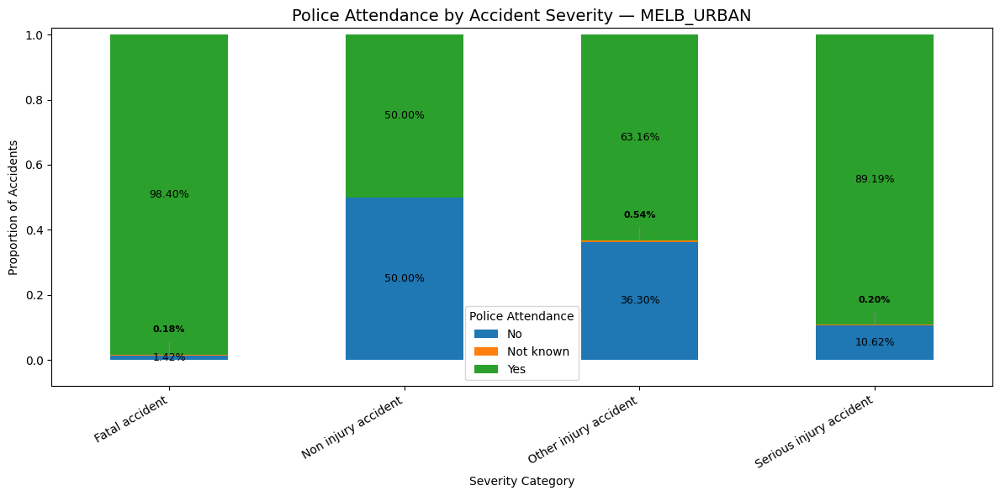

In [ ]:
mask_urban = df['DEG_URBAN_NAME'].astype(str).str.strip().str.upper() == 'MELB_URBAN'
df_urban = df.loc[mask_urban]

police_by_severity_urban = pd.crosstab(
    df_urban['SEVERITY'],
    df_urban['POLICE_ATTEND'],
    margins=True
)

police_by_severity_urban = police_by_severity_urban.drop(index='All', errors='ignore')
police_by_severity_urban = police_by_severity_urban.drop(columns='All', errors='ignore')

police_by_severity_urban_norm = police_by_severity_urban.div(
    police_by_severity_urban.sum(axis=1), axis=0
)

fig, ax = plt.subplots(figsize=(12, 6))

police_by_severity_urban_norm.plot(
    kind='bar',
    stacked=True,
    ax=ax,
)

plt.title("Police Attendance by Accident Severity — MELB_URBAN", fontsize=14)
plt.xlabel("Severity Category")
plt.ylabel("Proportion of Accidents")
plt.xticks(rotation=30, ha='right')
plt.legend(title="Police Attendance")

for container in ax.containers:
    for v in container:
        h = v.get_height()

        if h == 0:
            continue

        x = v.get_x() + v.get_width() / 2
        y = v.get_y() + h

        if h < 0.01:
            line_end = y + 0.04
            ax.plot([x, x], [y, line_end], color='gray', lw=1)

            label_y = line_end + 0.05
            ax.text(
                x,
                label_y,
                f"{h*100:.2f}%",
                ha='center',
                va='top',
                fontsize=8,
                fontweight='bold'
            )
        else:
            ax.text(
                x,
                v.get_y() + h/2,
                f"{h*100:.2f}%",
                ha='center',
                va='center',
                fontsize=9,
                color='black'
            )

ax.set_ylim(-0.08, 1.02)

plt.tight_layout()
plt.show()

## **Predictor for Binary Fatalities**

This section aims to explore how different factors can have an impact on the fatality of an accident. For that purpose, two distinct classifiers were implemented using different features to predict the fatality of an accident.

**Data preprocessing**

In [ ]:
cols_check = ['LIGHT_CONDITION', 'ROAD_GEOMETRY', 'SPEED_ZONE', 'ACCIDENT_TIME', 'LGA_NAME', 'DAY_OF_WEEK', 'ATMOSPH_COND_DESC', 'SURFACE_COND_DESC','FATALITY']

available_cols = [c for c in cols_check if c in accidents.columns]

missing_summary = pd.DataFrame({
    'Missing Values': accidents[available_cols].isna().sum(),
    'Missing Percent': (accidents[available_cols].isna().mean() * 100).round(2)
}).sort_values(by='Missing Percent', ascending=False)

display(missing_summary)

,Missing Values,Missing Percent
LGA_NAME,90,0.05
ROAD_GEOMETRY,0,0.00
LIGHT_CONDITION,0,0.00
SPEED_ZONE,0,0.00
ACCIDENT_TIME,0,0.00
DAY_OF_WEEK,0,0.00
FATALITY,0,0.00


**Data preparing**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, balanced_accuracy_score
from sklearn.ensemble import RandomForestClassifier


df = df.dropna(subset=['LIGHT_CONDITION', 'ROAD_GEOMETRY', 'SPEED_ZONE', 'ACCIDENT_TIME', 'LGA_NAME', 'DAY_OF_WEEK', 'ATMOSPH_COND_DESC', 'SURFACE_COND_DESC','FATALITY'])
df['ACCIDENT_TIME'] = pd.to_datetime(df['ACCIDENT_TIME'], format='%H:%M:%S', errors='coerce')

# Convert to decimal hours instead of string
df['HOUR_FLOAT'] = df['ACCIDENT_TIME'].dt.hour + df['ACCIDENT_TIME'].dt.minute / 60

# Features
x = df[['LIGHT_CONDITION', 'ROAD_GEOMETRY', 'SPEED_ZONE', 'HOUR_FLOAT', 'LGA_NAME', 'DAY_OF_WEEK', 'ATMOSPH_COND_DESC', 'SURFACE_COND_DESC']]
# Binary classification (0:non fatal; 1: fatal)
y = (df['FATALITY'] > 0).astype(int)

categ_feat = ['LIGHT_CONDITION', 'ROAD_GEOMETRY', 'SPEED_ZONE', 'HOUR_FLOAT', 'LGA_NAME', 'DAY_OF_WEEK', 'ATMOSPH_COND_DESC', 'SURFACE_COND_DESC']
# Transform categorical features into OneHotEncoders
preprocessor = ColumnTransformer(transformers=[('trans', OneHotEncoder(handle_unknown='ignore'), categ_feat)],remainder='passthrough')

# Split into train and test data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

**Logistic regression**

In [ ]:
# Training the model with this features: ['LIGHT_CONDITION', 'ROAD_GEOMETRY', 'SPEED_ZONE', 'ACCIDENT_TIME', 'LGA_NAME', 'DAY_OF_WEEK', 'ATMOSPH_COND_DESC', 'SURFACE_COND_DESC']

model = Pipeline(steps=[('preprocessor', preprocessor),('classifier', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000))])
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

print("Results of logistic regression:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))



/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1237: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.
  warnings.warn(


Results of logistic regression:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99     86637
           1       0.47      0.02      0.03      1567

    accuracy                           0.98     88204
   macro avg       0.72      0.51      0.51     88204
weighted avg       0.97      0.98      0.97     88204

Confusion Matrix:
 [[86605    32]
 [ 1539    28]]


The logistic regression is not very accurate because although the numbers are good, there is a class imbalance where it is mostly populated by non-fatal accidents.

**Random forest**

In [ ]:
rf_model = Pipeline(steps=[('preprocessor', preprocessor), ('clf', RandomForestClassifier(
n_estimators=100, random_state=42, n_jobs=-1, class_weight='balanced', oob_score=True, bootstrap=True))])

rf_model.fit(x_train, y_train)
rf_pred = rf_model.predict(x_test)

print("\nResults of Random Forest:\n", classification_report(y_test, rf_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, rf_pred))
print("Balanced Accuracy:", balanced_accuracy_score(y_test, rf_pred))


Results of Random Forest:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     86637
           1       0.94      0.80      0.86      1567

    accuracy                           1.00     88204
   macro avg       0.97      0.90      0.93     88204
weighted avg       1.00      1.00      1.00     88204

Confusion Matrix:
 [[86559    78]
 [  316  1251]]
Balanced Accuracy: 0.8987202351876686


The Random Forest model achieved a balanced accuracy of 0.899 in predicting fatal crashes (accidents with at least 1 fatality), substantially outperforming the logistic regression baseline (0.72). This indicates that fatal outcomes are driven by nonlinear combinations of conditions (e.g., high-speed zones, poor lighting, wet surfaces).

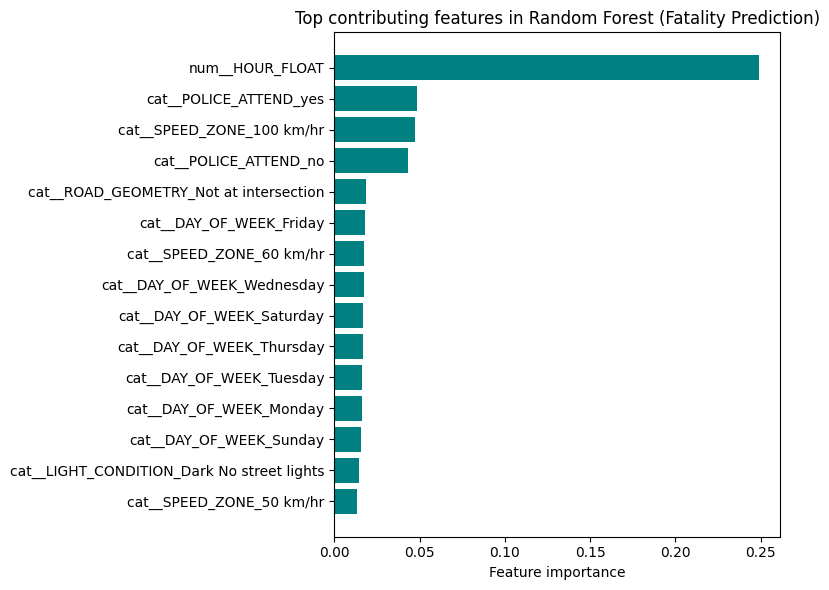

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

importances = rf.named_steps['clf'].feature_importances_
feature_names = rf.named_steps['prep'].get_feature_names_out()

indices = np.argsort(importances)[-15:]
plt.figure(figsize=(8,6))
plt.barh(range(len(indices)), importances[indices], color='teal', align='center')
plt.yticks(range(len(indices)), feature_names[indices])
plt.xlabel("Feature importance")
plt.title("Top contributing features in Random Forest (Fatality Prediction)")
plt.tight_layout()
plt.show()

**Recommendations**

To investigate further on police attendance, we require more inputs that could be of more help, such as location of police infrastructure, number of police personnel, duration it takes for police to arrive, etc.

## **Next steps**


*   Analyse vehicle types to identify which contribute most to severe and fatal crashes
* Explore regional patterns (urban vs rural areas) to locate accident hotspots requiring infrastructure improvements
* Incorporate additional data (hospital outcomes, police reports) to strengthen the accuracy of severity analysis